In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm, SymLogNorm, DivergingNorm
from matplotlib import ticker
import matplotlib.colors as colors
import qcodes as qc
import qcodes.instrument_drivers.nplab_drivers as npd
from scipy.optimize import curve_fit
from scipy.interpolate import interp2d
from os import path
import colorcet as cc
from scipy.interpolate import RectBivariateSpline

In [2]:
import colorcet as cc

In [3]:
from scipy.interpolate import RectBivariateSpline

In [4]:
from matplotlib.colors import Normalize
class DivLogNorm(Normalize):
    """Normalize a given value to the 0-1 range on a log scale."""
    def __init__(self, centerpct, vmin=None, vmax=None, clip=False):
        super().__init__(vmin, vmax, clip)
        self.centerpct = centerpct

    def __call__(self, value, clip=None):
        if clip is None:
            clip = self.clip

        result, is_scalar = self.process_value(value)

        result = np.ma.masked_less_equal(result, 0, copy=False)

        self.autoscale_None(result)
        vmin, vmax = self.vmin, self.vmax
        if vmin > vmax:
            raise ValueError("minvalue must be less than or equal to maxvalue")
        elif vmin <= 0:
            raise ValueError("values must all be positive")
        elif vmin == vmax:
            result.fill(0)
        else:
            if clip:
                mask = np.ma.getmask(result)
                result = np.ma.array(np.clip(result.filled(vmax), vmin, vmax),
                                     mask=mask)
            # in-place equivalent of above can be much faster
            resdat = result.data
            mask = result.mask
            if mask is np.ma.nomask:
                mask = (resdat <= 0)
            else:
                mask |= resdat <= 0
            np.copyto(resdat, 1, where=mask)
            np.log(resdat, resdat)
            resdat -= np.log(vmin)
            resdat /= (np.log(vmax) - np.log(vmin))
            result = np.ma.array(resdat, mask=mask, copy=False)
            result = np.ma.masked_array(
                np.interp(result, [0, self.centerpct, 1],
                          [0, 0.5, 1.]), mask=np.ma.getmask(result))
        if is_scalar:
            result = result[0]
        return result

    def inverse(self, value):
        if not self.scaled():
            raise ValueError("Not invertible until scaled")
        vmin, vmax = self.vmin, self.vmax

        if np.iterable(value):
            val = np.ma.asarray(value)
            return vmin * np.ma.power((vmax / vmin), val)
        else:
            return vmin * pow((vmax / vmin), value)

    def autoscale(self, A):
        # docstring inherited.
        super().autoscale(np.ma.masked_less_equal(A, 0, copy=False))

    def autoscale_None(self, A):
        # docstring inherited.
        super().autoscale_None(np.ma.masked_less_equal(A, 0, copy=False))

In [5]:
class DivSymLogNorm(colors.SymLogNorm):
    def __init__(self, linthresh, centerpct=0.5, linscale=1.0, vmin=None, vmax=None, clip=False):
        super().__init__(linthresh, linscale, vmin, vmax, clip)
        self.centerpct = centerpct
        
    def __call__(self, value, clip=None):
        if clip is None:
            clip = self.clip

        result, is_scalar = self.process_value(value)
        self.autoscale_None(result)
        vmin, vmax = self.vmin, self.vmax

        if vmin > vmax:
            raise ValueError("minvalue must be less than or equal to maxvalue")
        elif vmin == vmax:
            result.fill(0)
        else:
            if clip:
                mask = np.ma.getmask(result)
                result = np.ma.array(np.clip(result.filled(vmax), vmin, vmax),
                                     mask=mask)
            # in-place equivalent of above can be much faster
            resdat = self._transform(result.data)
            resdat -= self._lower
            resdat /= (self._upper - self._lower)
            result = np.ma.masked_array(
                np.interp(result, [0, self.centerpct, 1],
                          [0, 0.5, 1.]), mask=np.ma.getmask(result))

        if is_scalar:
            result = result[0]
        return result

In [6]:
np.errstate()

In [7]:
from IPython import display

In [8]:
# %matplotlib notebook

In [9]:
pwd

'/Users/robertpolski/Documents/NPGroupResearch/Measurements/Triton/qcodes_data/AnalysisNotebooks'

In [4]:
cd ..

/Users/robertpolski/Documents/NPGroupResearch/Measurements/Triton/qcodes_data


In [5]:
qc.DataSet.default_io.base_location = path.abspath('.')
figfile = path.abspath('.') + '/Figures/191126_M19_M20_M22_TBGWSe2/'

In [6]:
qc.DataSet.default_io.base_location

'/Users/robertpolski/Documents/NPGroupResearch/Measurements/Triton/qcodes_data'

In [7]:
figfile

'/Users/robertpolski/Documents/NPGroupResearch/Measurements/Triton/qcodes_data/Figures/191126_M19_M20_M22_TBGWSe2/'

In [8]:
%matplotlib widget

# Device M20

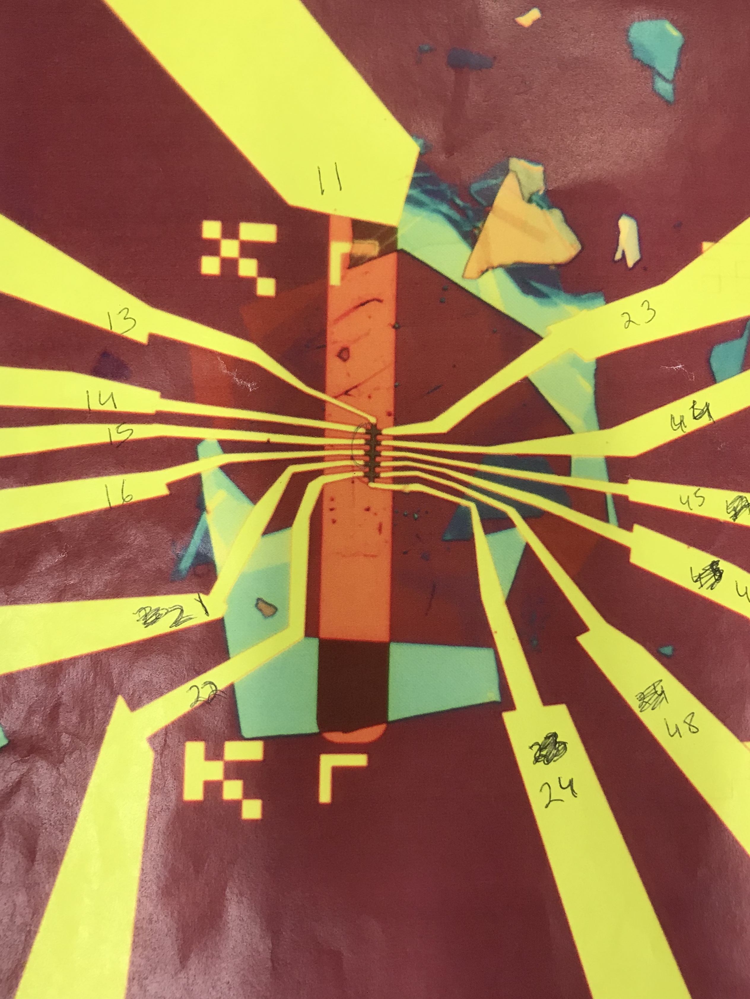

In [13]:
display.Image(figfile+'M20devfig.jpg')

### Fan diagrams

In [35]:
# electrodes 14-15 on lockin865, 16-21 on lockin830
datafans = qc.load_data('data/2019-11-29/#003_M20_14_15_865and16_45_830_5.9Tto0T_3nA_13.33Hz_11-42-24')

In [36]:
datafans

DataSet:
   location = 'data/2019-11-29/#003_M20_14_15_865and16_45_830_5.9Tto0T_3nA_13.33Hz_11-42-24'
   <Type>   | <array_id>                  | <array.name>     | <array.shape>
   Setpoint | triton_field_set_stable_set | field_set_stable | (119,)
   Setpoint | srframe_volt_p1_set         | volt_p1          | (119, 1201)
   Measured | lockin830_R                 | R                | (119, 1201)
   Measured | lockin830_X                 | X                | (119, 1201)
   Measured | lockin830_Y                 | Y                | (119, 1201)
   Measured | lockin865_R                 | R                | (119, 1201)
   Measured | lockin865_X                 | X                | (119, 1201)
   Measured | lockin865_Y                 | Y                | (119, 1201)

In [37]:
def Rxxfromdata(dset, current, instrument='lockin865'):
    """Use X for values less than 50000 ohms and R for anything larger.
    
    dset is the dataset from qc.load_data(), current is the constant current amplitude used (in A),
    and instrument can be lockin865 (default) or lockin830 if you want"""
    X = getattr(dset, str(instrument) + '_X')[:]/current
    Y = getattr(dset, str(instrument) + '_Y')[:]/current
    R = np.sqrt(X**2 + Y**2)
    
    if len(X.shape) == 1:
        for i, r in enumerate(R):
            if r > 5*10**4:
                X[i] = r
    elif len(X.shape) == 2:
        for j in range(R.shape[0]):
            for i, r in enumerate(R[j, :]):
                if r > 5*10**4:
                    X[j, i] = r
        
    return X

In [38]:
Rxx1415 = Rxxfromdata(datafans, 3e-9, 'lockin865')
fangate = datafans.srframe_volt_p1_set[0, :]
fanfield = datafans.triton_field_set_stable_set[:]

In [18]:
DivSymLogNorm(100, vmin=0, vmax=1e5)([0.3, 40, 50000, 700000])

masked_array(data=[5.59020017e-04, 7.45360023e-02, 9.18354645e-01,
                   1.00000000e+00],
             mask=False,
       fill_value=1e+20)

<IPython.core.display.Javascript object>


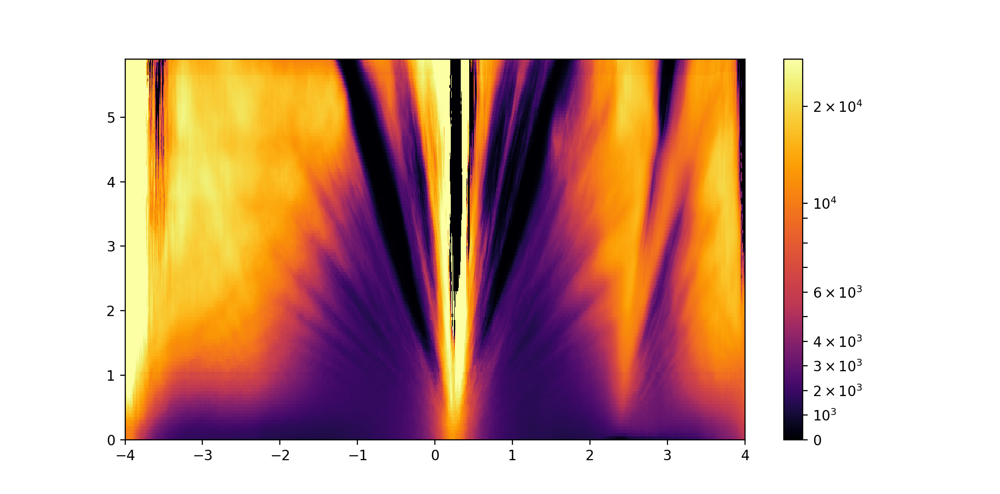

In [60]:
plt.figure()
plt.pcolormesh(fangate, fanfield, Rxx1415, norm=DivSymLogNorm(9000, 0.35, vmin=0, vmax=28000), cmap='inferno')
plt.colorbar()

<IPython.core.display.Javascript object>


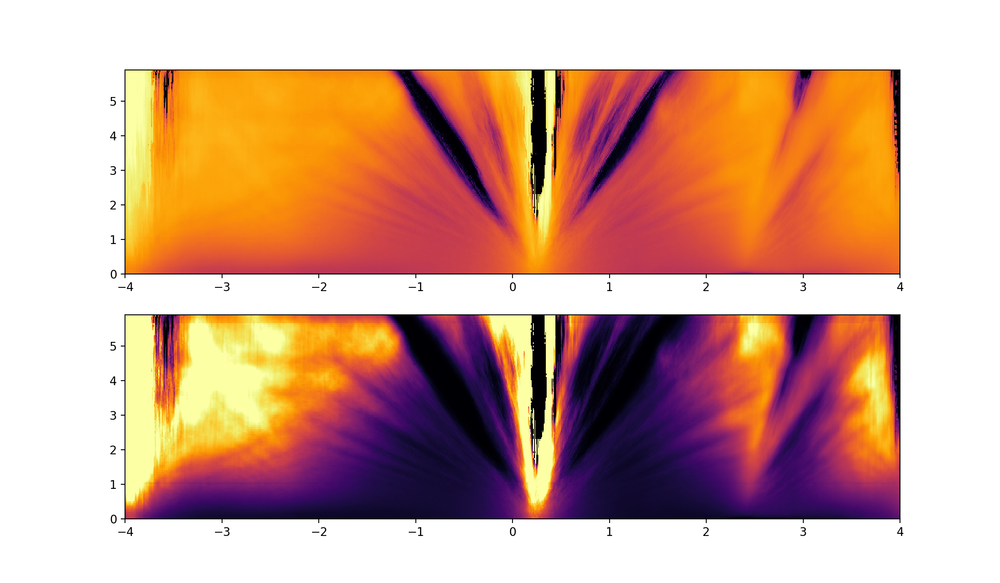

In [113]:
fig, ax = plt.subplots(2, 1, figsize=(12, 7))
ax[0].pcolormesh(fangate, fanfield, Rxx1415, norm=SymLogNorm(100, vmin=0, vmax=1e5), cmap='inferno')
ax[1].pcolormesh(fangate, fanfield, Rxx1415, vmin=0, vmax=2e4, cmap='inferno')

<IPython.core.display.Javascript object>


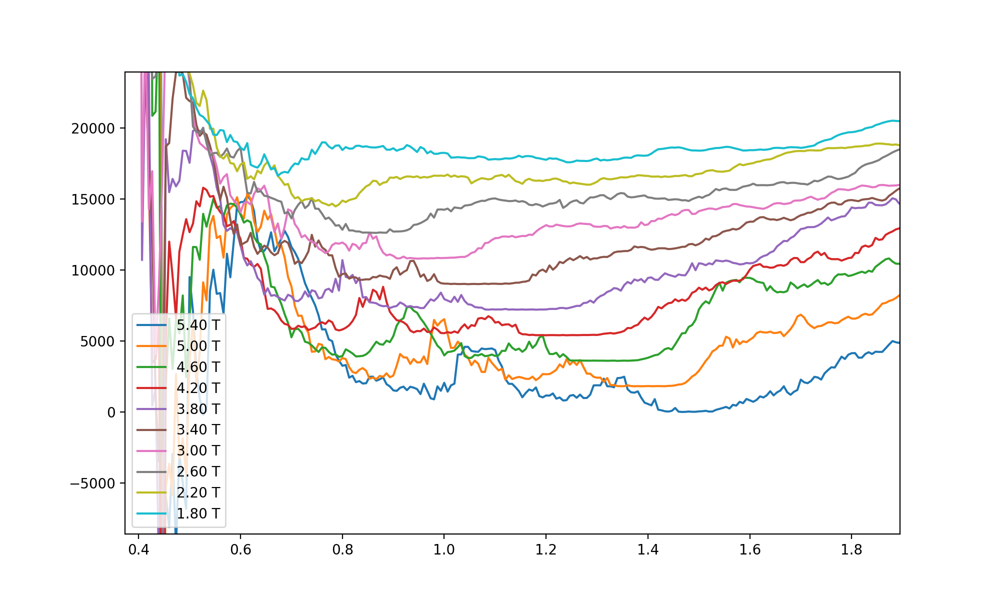

In [47]:
plt.figure(figsize=(10, 6))
for i in range(10):
    ind = 8*i + 10
    b = fanfield[ind]
    plt.plot(fangate, Rxx1415[ind, :] + 1800*i, label='{:.2f} T'.format(b))
    
plt.legend()

In [39]:
v4 = np.array([-0.9978, -0.904, -0.815, -0.709, -0.609, -0.529, -0.450, -0.381, -0.277, -0.177])
b4 = np.array([5.4, 5, 4.6, 4.2, 3.8, 3.4, 3, 2.6, 2.2, 1.8])
vpos4 = np.array([1.496, 1.395, 1.336, 1.258, 1.170, 1.083, 0.981, 0.869, 0.769, 0.667])
bpos4 = b4

vs = np.concatenate((v4, vpos4))
bs = np.concatenate((-4*b4, 4*bpos4))

sl, b = np.polyfit(vs, bs, 1)
print(sl, b)
V0 = -b/sl
C = sl*1.602e-19**2/6.626e-34
dbn = 8.85e-12*3/C
print('effective hBN thickness: {:.2f}'.format(dbn*10**9))

17.114662857569453 -4.428590161024674
effective hBN thickness: 40.05


In [40]:
V0

0.25876000000000016

<IPython.core.display.Javascript object>


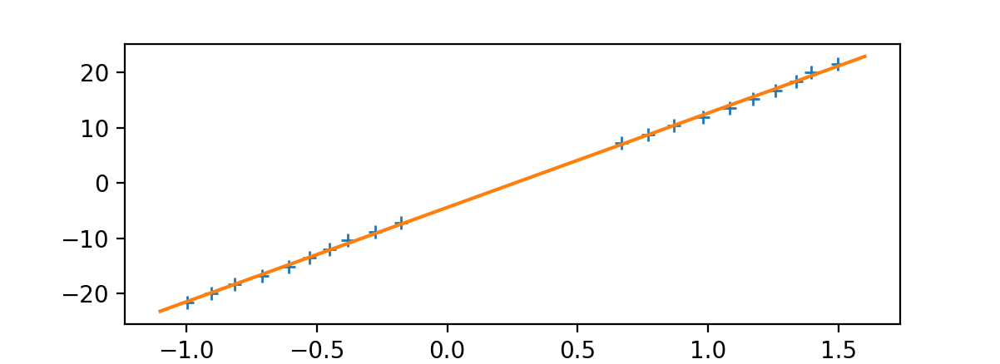

In [54]:
plt.figure()
plt.plot(vs, bs, '+')
x1 = np.array([-1.1, 1.6])
plt.plot(x1, x1*sl + b)

In [41]:
n = C*(fangate - V0)/1.602e-19/10**16

<IPython.core.display.Javascript object>


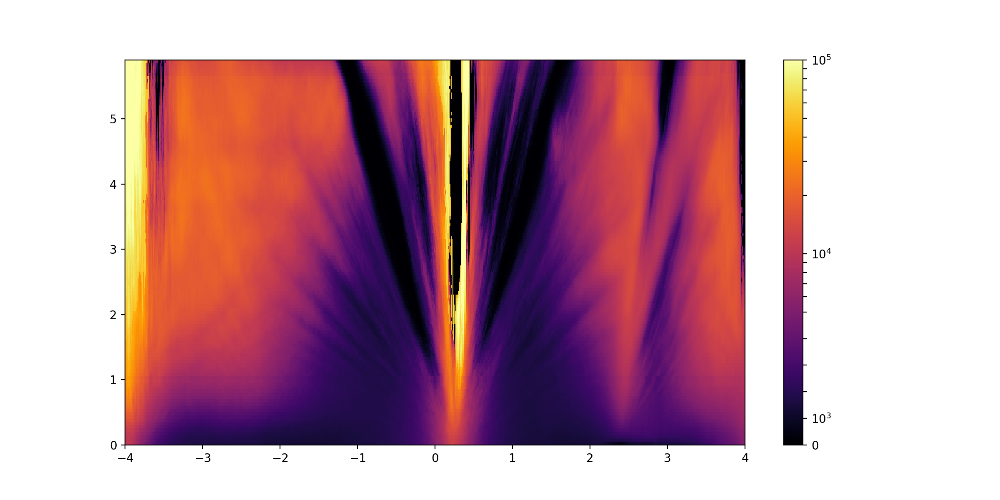

In [254]:
plt.figure(figsize=(12, 6))
plt.pcolormesh(fangate, fanfield, Rxx1415, norm=SymLogNorm(5000, vmin=0, vmax=1e5), cmap='inferno')
plt.colorbar()

<IPython.core.display.Javascript object>


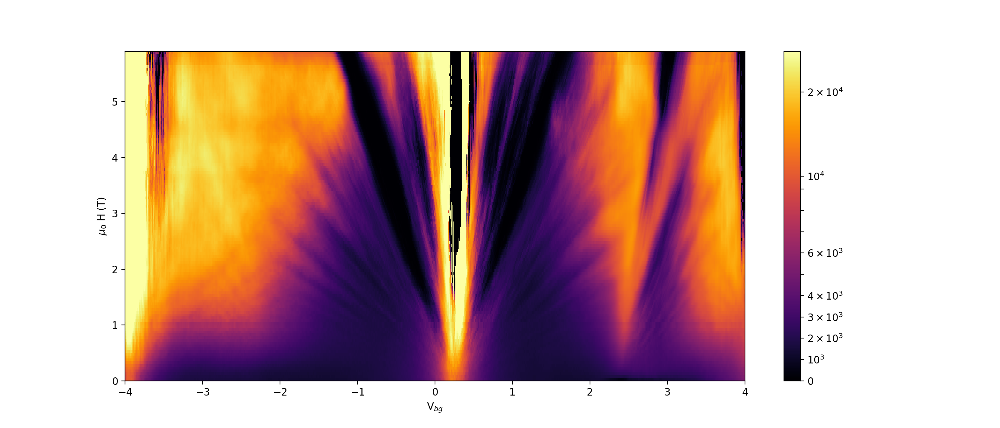

In [381]:
plt.figure(figsize=(14, 6))
plt.pcolormesh(fangate, fanfield, Rxx1415, norm=SymLogNorm(9000, vmin=0, vmax=28000), cmap='inferno')
# norm=SymLogNorm(100, vmin=0, vmax=8000)
plt.colorbar()
plt.xlabel('V$_{bg}$')
plt.ylabel('$\mu_0$ H (T)')
# plt.savefig(figfile+'M20_1415_Fan', dpi=400)

<IPython.core.display.Javascript object>


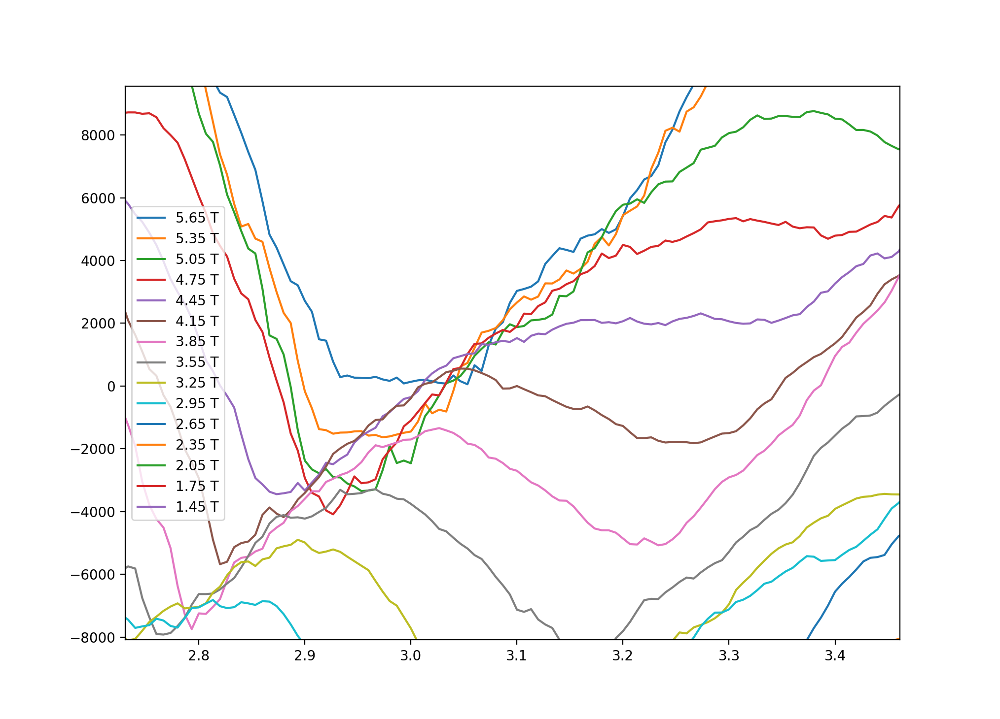

In [70]:
plt.figure(figsize=(10, 6))
for i in range(15):
    ind = 6*i + 5
    b = fanfield[ind]
    plt.plot(fangate, Rxx1415[ind, :] - 1800*i, label='{:.2f} T'.format(b))
    
plt.legend()

In [42]:
# half filling
v1 = np.array([2.737, 2.768, 2.797, 2.825, 2.880, 2.927, 2.941, 2.962, 2.996])
b1 = np.array([3.25, 3.55, 3.85, 4.15, 4.45, 4.75, 5.05, 5.35, 5.65])
v2 = np.array([2.75, 2.833, 2.904, 2.968, 3.027, 3.108, 3.174, 3.233, 3.275])
b2 = np.array([1.75, 2.05, 2.35, 2.65, 2.95, 3.25, 3.55, 3.85, 4.15])

vshalf = np.concatenate((v1, v2))
bshalf = np.concatenate((b1*2, b2*4))

halfsl, halfb = np.polyfit(vshalf, bshalf, 1)
Vhalf = -halfb/halfsl
print(halfsl, halfb)

17.99913656084725 -42.752452614655176


In [43]:
Vhalf

2.375250194370587

<IPython.core.display.Javascript object>


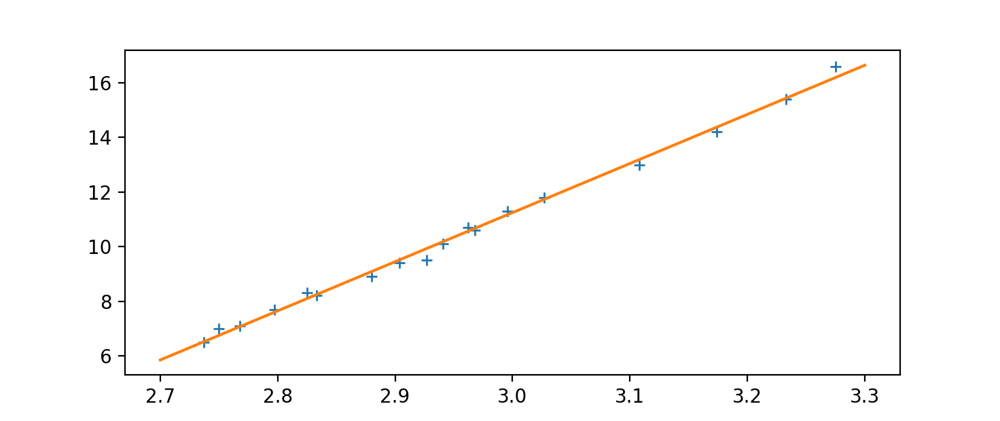

In [111]:
plt.figure()
plt.plot(vshalf, bshalf, '+')
# plt.plot(vs - V0, bs, '+')
x1 = np.array([2.7, 3.3])
plt.plot(x1, x1*halfsl + halfb)

In [45]:
print(2*(Vhalf - V0)) # full gate voltage difference
nhalf = C*(Vhalf - V0)/1.602e-19
a = 0.246e-9
theta = np.sqrt(np.sqrt(3)*(2*nhalf)*a**2/8)*180/np.pi
print('angle for contacts 14-15: {:.4f} degrees'.format(theta))

4.232980388741174
angle for contacts 14-15: 0.8680 degrees


<IPython.core.display.Javascript object>


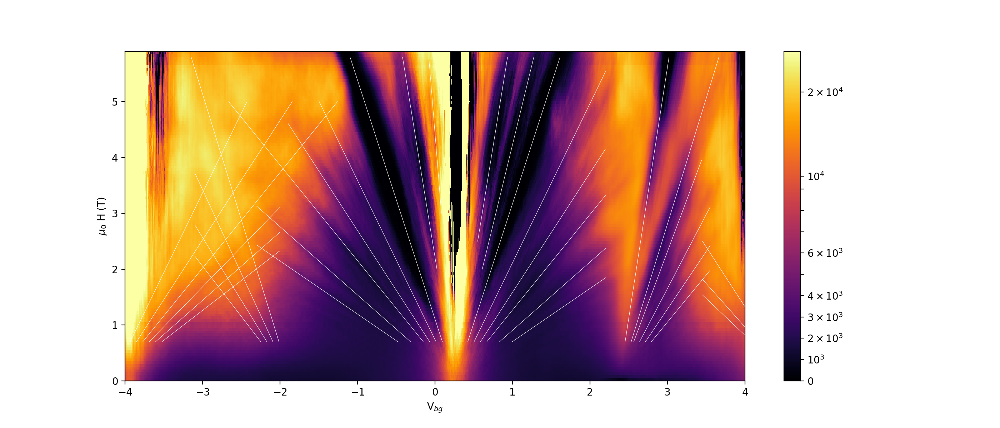

Text(0, 0.5, '$\\mu_0$ H (T)')

In [25]:
plt.figure(figsize=(14, 6))
plt.pcolormesh(fangate, fanfield, Rxx1415, norm=SymLogNorm(9000, vmin=0, vmax=28000), cmap='inferno')
# norm=SymLogNorm(100, vmin=0, vmax=8000)
plt.colorbar()
# x0 = np.array([V0, 0.5])
# x2 = np.array([V0, 0.75])
# x1 = np.array([V0, 1.1])
# plt.plot(x0, (x0*sl + b), color='white')
# plt.plot(x1, (x1*sl + b)/4, color='white')
# plt.plot(x1, (x1*sl + b)/6, color='white')
# plt.plot(x1, (x1*sl + b)/8, color='white')
# plt.plot(x2, (x2*sl + b)/2, color='white')

B = 5.8
Bs = 0.7
LW = 0.4

for i in [-4, 4]:
    x = np.array([(B*i - b)/sl, (Bs*i - b)/sl])
    plt.plot(x, (x*sl + b)/i, color='white', lw=LW)

i = -2
x = np.array([(B*i - b)/sl, (2*i - b)/sl])
plt.plot(x, (x*sl + b)/i, color='white', lw=LW)

i = 2
x = np.array([(B*i - b)/sl, (2.5*i - b)/sl])
plt.plot(x, (x*sl + b)/i, color='white', lw=LW)

i = 3
x = np.array([(B*i - b)/sl, (2*i - b)/sl])
plt.plot(x, (x*sl + b)/i, color='white', lw=LW)

i = -1
x = np.array([(B*i - b)/sl, (3*i - b)/sl])
plt.plot(x, (x*sl + b)/i, color='white', lw=LW)
    
for i in [6, 8, 10, 14, 18]:
    x = np.array([(Bs*i - b)/sl, 2.2])
    plt.plot(x, (x*sl + b)/i, color='white', lw=LW)
    
for i in [-18, -14]:
    x = np.array([(Bs*i - b)/sl, -2.3])
    plt.plot(x, (x*sl + b)/i, color='white', lw=LW)

i = -6
x = np.array([(Bs*i - b)/sl, -1.5])
plt.plot(x, (x*sl + b)/i, color='white', lw=LW)

i = -8
x = np.array([(Bs*i - b)/sl, -1.9])
plt.plot(x, (x*sl + b)/i, color='white', lw=LW)

i = -10
x = np.array([(Bs*i - b)/sl, (5*i - b)/sl])
plt.plot(x, (x*sl + b)/i, color='white', lw=LW)

#Half filling
for i in [2, 4]:
    x = np.array([(Bs*i - halfb)/halfsl, (B*i - halfb)/halfsl])
    plt.plot(x, (x*halfsl + halfb)/i, color='white', lw=LW)

    
i = 5
i = i*0.97
x = np.array([(Bs*i - halfb)/halfsl, 3.44])
plt.plot(x, (x*halfsl + halfb)/i, color='white', lw=LW)
    
for i in [7, 9, 11]:
    i = i*0.97
    x = np.array([(Bs*i - halfb)/halfsl, 3.55])
    plt.plot(x, (x*halfsl + halfb)/i, color='white', lw=LW)
    
#neg half filling


bm = halfb + halfsl*2*(Vhalf-V0)
for i in [-4]:
    x = np.array([(Bs*i - bm)/halfsl, (B*i - bm)/halfsl])
    plt.plot(x, (x*halfsl + bm)/i, color='white', lw=LW)
    
for i in [-6, -8, -10]:
    x = np.array([(Bs*i - bm)/halfsl, -3.1])
    plt.plot(x, (x*halfsl + bm)/i, color='white', lw=LW)
    
#neg full filling
bf = bm + halfsl*(Vhalf-V0)
for i in [6, 8, 10]:
    x = np.array([(Bs*i - bf)/sl, (5*i - bf)/sl])
    plt.plot(x, (x*sl + bf)/i, color='white', lw=LW)
    
for i in [12, 14, 16]:
    x = np.array([(Bs*i - bf)/sl, -2])
    plt.plot(x, (x*sl + bf)/i, color='white', lw=LW)
    
#full filling
# vfp = V0 + 2*(Vhalf-V0)
# bfp = halfb*vfp/V0
bfp = halfb - sl*(Vhalf-V0)-0.1

for i in [-8, -11, -13]:
    x = np.array([4, 3.45])
    plt.plot(x, (x*sl + bfp)/i, color='white', lw=LW)

# plt.xlabel('n (10$^{12}$ cm$^{-2}$)')
plt.xlabel('V$_{bg}$')
plt.ylabel('$\mu_0$ H (T)')

# plt.savefig(figfile+'M20_1415_Fanwithlines', dpi=400)

<IPython.core.display.Javascript object>


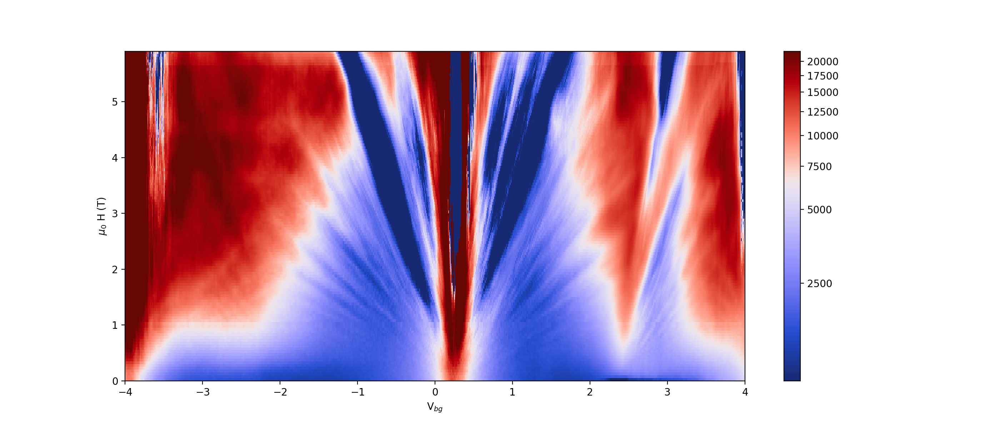

Text(0, 0.5, '$\\mu_0$ H (T)')

In [371]:
# coff = colors.DivergingNorm(vcenter=8000, vmin=0, vmax=22000)
# fig, ax = plt.subplots(3, 1)
cdivlog = DivLogNorm(0.6, 1000, 22000)

Rxx1415_2 = np.copy(Rxx1415)
Rxx1415_2[Rxx1415_2 <= 0] = np.min(np.abs(Rxx1415_2))


plt.figure(figsize=(14, 6))
plt.pcolormesh(fangate, fanfield, Rxx1415_2, norm=cdivlog, cmap=cc.cm.diverging_bwr_20_95_c54)
# norm=SymLogNorm(100, vmin=0, vmax=8000)
plt.colorbar()
# x0 = np.array([V0, 0.5])
# x2 = np.array([V0, 0.75])
# x1 = np.array([V0, 1.1])
# plt.plot(x0, (x0*sl + b), color='white')
# plt.plot(x1, (x1*sl + b)/4, color='white')
# plt.plot(x1, (x1*sl + b)/6, color='white')
# plt.plot(x1, (x1*sl + b)/8, color='white')
# plt.plot(x2, (x2*sl + b)/2, color='white')

# B = 5.8
# Bs = 0.7
# LW = 0.4

# for i in [-4, 4]:
#     x = np.array([(B*i - b)/sl, (Bs*i - b)/sl])
#     plt.plot(x, (x*sl + b)/i, color='white', lw=LW)

# i = -2
# x = np.array([(B*i - b)/sl, (2*i - b)/sl])
# plt.plot(x, (x*sl + b)/i, color='white', lw=LW)

# i = 2
# x = np.array([(B*i - b)/sl, (2.5*i - b)/sl])
# plt.plot(x, (x*sl + b)/i, color='white', lw=LW)

# i = 3
# x = np.array([(B*i - b)/sl, (2*i - b)/sl])
# plt.plot(x, (x*sl + b)/i, color='white', lw=LW)

# i = -1
# x = np.array([(B*i - b)/sl, (3*i - b)/sl])
# plt.plot(x, (x*sl + b)/i, color='white', lw=LW)
    
# for i in [6, 8, 10, 14, 18]:
#     x = np.array([(Bs*i - b)/sl, 2.2])
#     plt.plot(x, (x*sl + b)/i, color='white', lw=LW)
    
# for i in [-18, -14]:
#     x = np.array([(Bs*i - b)/sl, -2.3])
#     plt.plot(x, (x*sl + b)/i, color='white', lw=LW)

# i = -6
# x = np.array([(Bs*i - b)/sl, -1.5])
# plt.plot(x, (x*sl + b)/i, color='white', lw=LW)

# i = -8
# x = np.array([(Bs*i - b)/sl, -1.9])
# plt.plot(x, (x*sl + b)/i, color='white', lw=LW)

# i = -10
# x = np.array([(Bs*i - b)/sl, (5*i - b)/sl])
# plt.plot(x, (x*sl + b)/i, color='white', lw=LW)

# #Half filling
# for i in [2, 4]:
#     x = np.array([(Bs*i - halfb)/halfsl, (B*i - halfb)/halfsl])
#     plt.plot(x, (x*halfsl + halfb)/i, color='white', lw=LW)

    
# i = 5
# i = i*0.97
# x = np.array([(Bs*i - halfb)/halfsl, 3.44])
# plt.plot(x, (x*halfsl + halfb)/i, color='white', lw=LW)
    
# for i in [7, 9, 11]:
#     i = i*0.97
#     x = np.array([(Bs*i - halfb)/halfsl, 3.55])
#     plt.plot(x, (x*halfsl + halfb)/i, color='white', lw=LW)
    
# #neg half filling


# bm = halfb + halfsl*2*(Vhalf-V0)
# for i in [-4]:
#     x = np.array([(Bs*i - bm)/halfsl, (B*i - bm)/halfsl])
#     plt.plot(x, (x*halfsl + bm)/i, color='white', lw=LW)
    
# for i in [-6, -8, -10]:
#     x = np.array([(Bs*i - bm)/halfsl, -3.1])
#     plt.plot(x, (x*halfsl + bm)/i, color='white', lw=LW)
    
# #neg full filling
# bf = bm + halfsl*(Vhalf-V0)
# for i in [6, 8, 10]:
#     x = np.array([(Bs*i - bf)/sl, (5*i - bf)/sl])
#     plt.plot(x, (x*sl + bf)/i, color='white', lw=LW)
    
# for i in [12, 14, 16]:
#     x = np.array([(Bs*i - bf)/sl, -2])
#     plt.plot(x, (x*sl + bf)/i, color='white', lw=LW)
    
# #full filling
# # vfp = V0 + 2*(Vhalf-V0)
# # bfp = halfb*vfp/V0
# bfp = halfb - sl*(Vhalf-V0)-0.1

# for i in [-8, -11, -13]:
#     x = np.array([4, 3.45])
#     plt.plot(x, (x*sl + bfp)/i, color='white', lw=LW)

# plt.xlabel('n (10$^{12}$ cm$^{-2}$)')
plt.xlabel('V$_{bg}$')
plt.ylabel('$\mu_0$ H (T)')

# plt.savefig(figfile+'M20_1415_Fanwithlines', dpi=400)

<IPython.core.display.Javascript object>


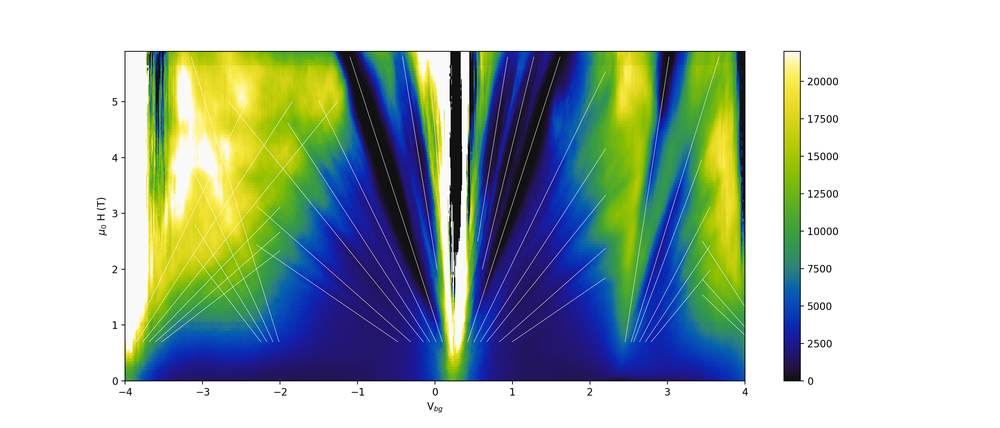

Text(0, 0.5, '$\\mu_0$ H (T)')

In [280]:
coff = colors.DivergingNorm(vcenter=8000, vmin=0, vmax=22000)


plt.figure(figsize=(14, 6))
plt.pcolormesh(fangate, fanfield, Rxx1415, norm=coff, cmap=cc.cm.linear_kbgyw_5_98_c62)
# norm=SymLogNorm(100, vmin=0, vmax=8000)
plt.colorbar()
# x0 = np.array([V0, 0.5])
# x2 = np.array([V0, 0.75])
# x1 = np.array([V0, 1.1])
# plt.plot(x0, (x0*sl + b), color='white')
# plt.plot(x1, (x1*sl + b)/4, color='white')
# plt.plot(x1, (x1*sl + b)/6, color='white')
# plt.plot(x1, (x1*sl + b)/8, color='white')
# plt.plot(x2, (x2*sl + b)/2, color='white')

B = 5.8
Bs = 0.7
LW = 0.4

for i in [-4, 4]:
    x = np.array([(B*i - b)/sl, (Bs*i - b)/sl])
    plt.plot(x, (x*sl + b)/i, color='white', lw=LW)

i = -2
x = np.array([(B*i - b)/sl, (2*i - b)/sl])
plt.plot(x, (x*sl + b)/i, color='white', lw=LW)

i = 2
x = np.array([(B*i - b)/sl, (2.5*i - b)/sl])
plt.plot(x, (x*sl + b)/i, color='white', lw=LW)

i = 3
x = np.array([(B*i - b)/sl, (2*i - b)/sl])
plt.plot(x, (x*sl + b)/i, color='white', lw=LW)

i = -1
x = np.array([(B*i - b)/sl, (3*i - b)/sl])
plt.plot(x, (x*sl + b)/i, color='white', lw=LW)
    
for i in [6, 8, 10, 14, 18]:
    x = np.array([(Bs*i - b)/sl, 2.2])
    plt.plot(x, (x*sl + b)/i, color='white', lw=LW)
    
for i in [-18, -14]:
    x = np.array([(Bs*i - b)/sl, -2.3])
    plt.plot(x, (x*sl + b)/i, color='white', lw=LW)

i = -6
x = np.array([(Bs*i - b)/sl, -1.5])
plt.plot(x, (x*sl + b)/i, color='white', lw=LW)

i = -8
x = np.array([(Bs*i - b)/sl, -1.9])
plt.plot(x, (x*sl + b)/i, color='white', lw=LW)

i = -10
x = np.array([(Bs*i - b)/sl, (5*i - b)/sl])
plt.plot(x, (x*sl + b)/i, color='white', lw=LW)

#Half filling
for i in [2, 4]:
    x = np.array([(Bs*i - halfb)/halfsl, (B*i - halfb)/halfsl])
    plt.plot(x, (x*halfsl + halfb)/i, color='white', lw=LW)

    
i = 5
i = i*0.97
x = np.array([(Bs*i - halfb)/halfsl, 3.44])
plt.plot(x, (x*halfsl + halfb)/i, color='white', lw=LW)
    
for i in [7, 9, 11]:
    i = i*0.97
    x = np.array([(Bs*i - halfb)/halfsl, 3.55])
    plt.plot(x, (x*halfsl + halfb)/i, color='white', lw=LW)
    
#neg half filling


bm = halfb + halfsl*2*(Vhalf-V0)
for i in [-4]:
    x = np.array([(Bs*i - bm)/halfsl, (B*i - bm)/halfsl])
    plt.plot(x, (x*halfsl + bm)/i, color='white', lw=LW)
    
for i in [-6, -8, -10]:
    x = np.array([(Bs*i - bm)/halfsl, -3.1])
    plt.plot(x, (x*halfsl + bm)/i, color='white', lw=LW)
    
#neg full filling
bf = bm + halfsl*(Vhalf-V0)
for i in [6, 8, 10]:
    x = np.array([(Bs*i - bf)/sl, (5*i - bf)/sl])
    plt.plot(x, (x*sl + bf)/i, color='white', lw=LW)
    
for i in [12, 14, 16]:
    x = np.array([(Bs*i - bf)/sl, -2])
    plt.plot(x, (x*sl + bf)/i, color='white', lw=LW)
    
#full filling
# vfp = V0 + 2*(Vhalf-V0)
# bfp = halfb*vfp/V0
bfp = halfb - sl*(Vhalf-V0)-0.1

for i in [-8, -11, -13]:
    x = np.array([4, 3.45])
    plt.plot(x, (x*sl + bfp)/i, color='white', lw=LW)

# plt.xlabel('n (10$^{12}$ cm$^{-2}$)')
plt.xlabel('V$_{bg}$')
plt.ylabel('$\mu_0$ H (T)')

# plt.savefig(figfile+'M20_1415_Fanwithlines', dpi=400)

In [285]:
-halfb/halfsl

2.375250194370587

<IPython.core.display.Javascript object>


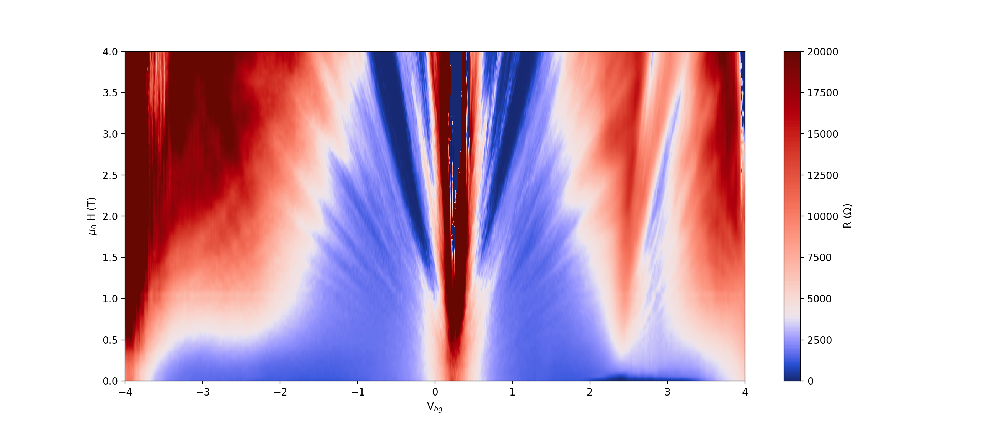

Text(0, 0.5, '$\\mu_0$ H (T)')

In [368]:

fanfunc1415 = RectBivariateSpline(fangate, fanfield[38:][::-1], np.flip(Rxx1415[38:, :], axis=0).T)#, s=0.988872658884731064e11)
gateint = np.linspace(-4, 4, 1001)
fieldint = np.linspace(0, 4, 501)

plt.figure(figsize=(14, 6))
coff = colors.DivergingNorm(4000, vmin=0, vmax=0.2e5)
Rxxint = fanfunc1415(gateint, fieldint).T
# find = npd.val_to_index([0.98, 1.09], fieldint)
# Rxxint[find[0]:find[1], :] = fanfunc1621_for1(gateint, fieldint[find[0]:find[1]]).T

plt.pcolormesh(gateint, fieldint, Rxxint, norm=coff, cmap=cc.cm.diverging_bwr_20_95_c54) #norm=SymLogNorm(9000, vmin=0, vmax=0.5e5)

plt.colorbar(label='R ($\Omega$)')

plt.xlabel('V$_{bg}$')
plt.ylabel('$\mu_0$ H (T)')

Based on this plot, we should be able to get the angle pretty accurately from the full-filling and CNP x-intercepts

In [26]:
V0  # charge neutrality x-intercept

0.25876000000000016

In [27]:
Vfn = -bf/sl
print(Vfn) # negative full filling point

-4.1796052948959215


In [28]:
Vfp = -bfp/sl
print(Vfp) # positive full filling point

4.620334586239658


In [29]:
(Vfp - Vfn)/2

4.3999699405677895

In [30]:
(Vfn + Vfp)/2  # a little off from the actual center, but not by much

0.22036464567186842

In [31]:
a = 0.246e-9

In [32]:
nf2 = (Vfp - Vfn)/2*C/1.602e-19 # The density of full filling (taken as half the positive-negative)
print(nf2/10**16)  # in 10**12 cm^-2
thetafan1 = np.sqrt(np.sqrt(3)*(nf2)*a**2/8)*180/np.pi
print('angle for contacts 14-15: {:.4f} degrees'.format(thetafan1))

1.8206612041992865
angle for contacts 14-15: 0.8849 degrees


In [34]:
Vdifffull = (Vfp - Vfn)/2
print(Vdifffull)

4.3999699405677895


### Second fan

In [293]:
Rxx1621 = Rxxfromdata(datafans, 3e-9, 'lockin830')

In [257]:
fanfield[38]

4.0

Only including to 4T

<IPython.core.display.Javascript object>


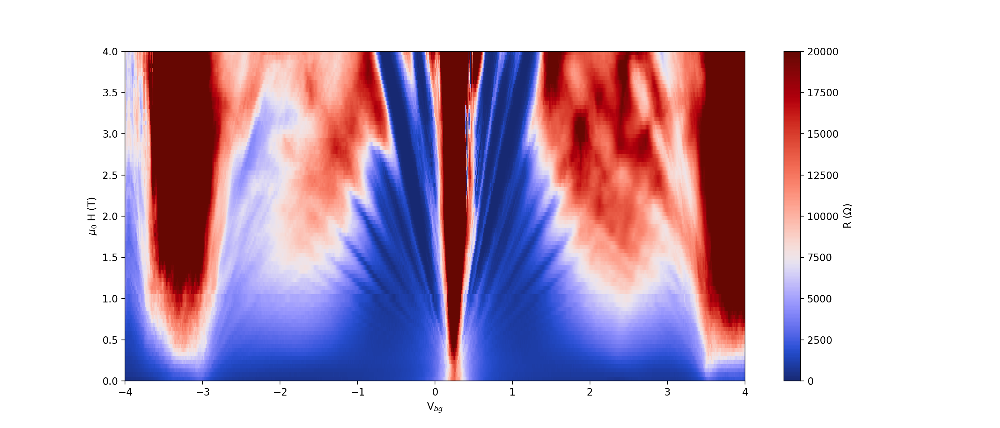

Text(0, 0.5, '$\\mu_0$ H (T)')

In [276]:
plt.figure(figsize=(14, 6))
coff = colors.DivergingNorm(7500, vmin=0, vmax=0.2e5)
# fig, ax = plt.subplots(2, 1, figsize=(14, 8))
plt.pcolormesh(fangate, fanfield[38:], Rxx1621[38:, :], norm=coff, cmap=cc.cm.diverging_bwr_20_95_c54) #norm=SymLogNorm(9000, vmin=0, vmax=0.5e5)
# ax[1].pcolormesh(fangate, fanfield[38:], Rxx1621[38:, :], vmin=-1000, vmax=0.2e5, cmap='inferno')
plt.colorbar(label='R ($\Omega$)')

plt.xlabel('V$_{bg}$')
plt.ylabel('$\mu_0$ H (T)')

# plt.savefig(figfile+'M20_1621_Fan', dpi=400)

In [348]:
# fanfunc1621_for1 = RectBivariateSpline(fangate, fanfield[38:][::-1], np.flip(Rxx1621[38:, :], axis=0).T, s=0.5868615e11)

<IPython.core.display.Javascript object>


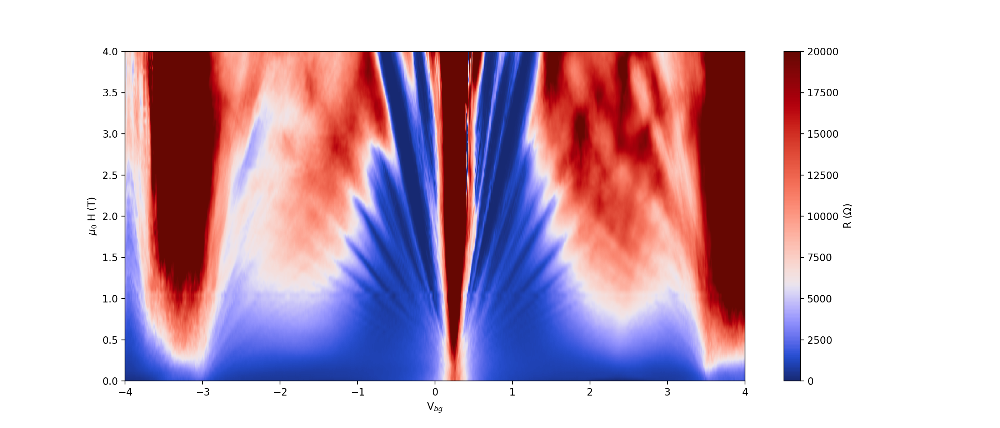

Text(0, 0.5, '$\\mu_0$ H (T)')

In [350]:
fanfunc1621 = RectBivariateSpline(fangate, fanfield[38:][::-1], np.flip(Rxx1621[38:, :], axis=0).T)#, s=0.988872658884731064e11)
gateint = np.linspace(-4, 4, 1001)
fieldint = np.linspace(0, 4, 501)

plt.figure(figsize=(14, 6))
coff = colors.DivergingNorm(6000, vmin=0, vmax=0.2e5)
Rxxint = fanfunc1621(gateint, fieldint).T
# find = npd.val_to_index([0.98, 1.09], fieldint)
# Rxxint[find[0]:find[1], :] = fanfunc1621_for1(gateint, fieldint[find[0]:find[1]]).T

plt.pcolormesh(gateint, fieldint, Rxxint, norm=coff, cmap=cc.cm.diverging_bwr_20_95_c54) #norm=SymLogNorm(9000, vmin=0, vmax=0.5e5)

plt.colorbar(label='R ($\Omega$)')

plt.xlabel('V$_{bg}$')
plt.ylabel('$\mu_0$ H (T)')

In [624]:
a = plt.axis()

In [33]:
slfull

NameError: name 'slfull' is not defined

In [583]:
V0cnp2 + (Vfull - V0cnp2)/2

2.009929505656232

In [ ]:
y = m*x + (-V0*m) ->  y = m*x + (-V02*m)

In [508]:
-bfull/slfull

3.75772914166108

In [513]:
V0cnp2 - (Vfull - V0cnp2)

-3.233469402358312

In [509]:
-bfulln/slfull

-2.2621259018639246

In [488]:
bfull

74.15691506286662

<IPython.core.display.Javascript object>


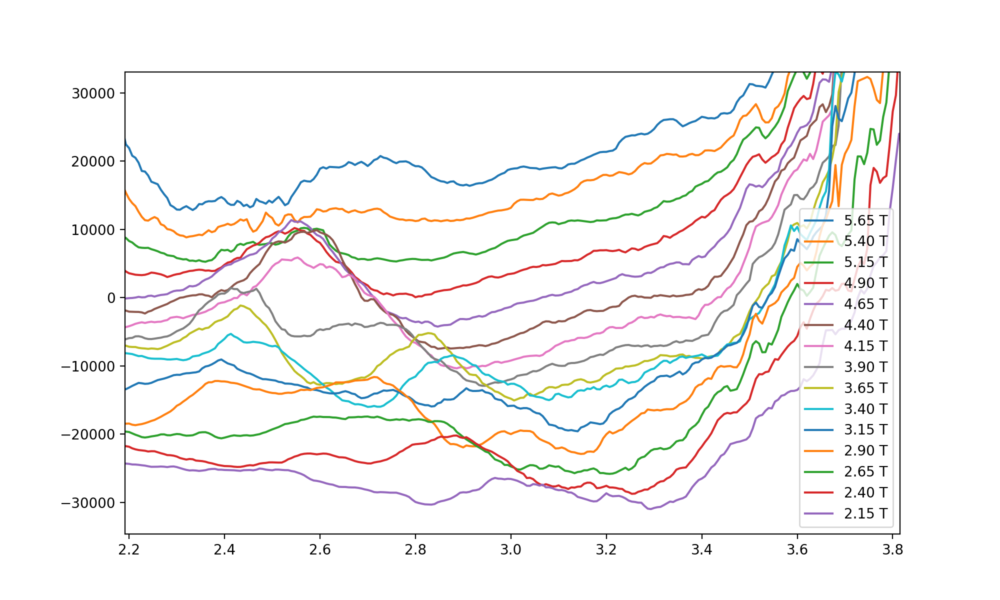

In [457]:
plt.figure(figsize=(10, 6))
for i in range(15):
    ind = 5*i + 5
    bfield = fanfield[ind]
    plt.plot(fangate, Rxx1621[ind, :] - 2800*i, label='{:.2f} T'.format(bfield))
    
plt.legend()

In [294]:
vcnp1 = np.array([0.604, 0.632, 0.653, 0.692, 0.731, 0.759, 0.788, ])
bcnp1 = np.array([2.9, 3.15, 3.4, 3.65, 3.9, 4.15, 4.4])
vcnp2 = np.array([0.625, 0.66, 0.714, 0.760, 0.801, 0.856, 0.914, 0.961, 1.006])
bcnp2 = np.array([2.15, 2.4, 2.65, 2.9, 3.15, 3.4, 3.65, 3.9, 4.15])
vcnp3 = np.array([0.773, 0.834, 0.910, 0.969, 1.016, 1.085, 1.124, 1.178, 1.234, 1.287, 1.354, 1.42, 1.474, 1.517, 1.578])
bcnp3 = np.array([2.15, 2.4, 2.65, 2.9, 3.15, 3.4, 3.65, 3.9, 4.15, 4.4, 4.65, 4.9, 5.15, 5.4, 5.65])

vscnp = np.concatenate((vcnp1, vcnp2, vcnp3))
bscnp = np.concatenate((2*bcnp1, 3*bcnp2, 4*bcnp3))

slcnp, bcnp = np.polyfit(vscnp, bscnp, 1)
V0cnp2 = -bcnp/slcnp
print(slcnp, bcnp)
print(V0cnp2)

16.992629165630916 -4.454275668221137
0.26212986965138396


<IPython.core.display.Javascript object>


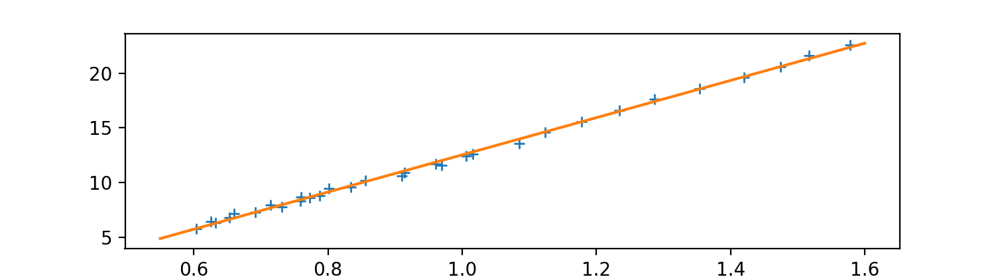

In [140]:
plt.figure()
plt.plot(vscnp, bscnp, '+')
x1 = np.array([0.55, 1.6])
plt.plot(x1, x1*slcnp + bcnp)

In [35]:
print(slcnp, sl)

16.992629165630916 17.114662857569453


In [36]:
print(V0, V0cnp2)

0.25876000000000016 0.26212986965138396


In [295]:
vsfull1 = np.array([3.297, 3.258, 3.203, 3.153, 3.139, 3.091, 3.015, 2.946, 2.889, 2.859, 2.825, 2.774])
bsfull1 = np.array([2.15, 2.4, 2.65, 2.9, 3.15, 3.4, 3.65, 3.9, 4.15, 4.40, 4.65, 4.9])

vsfull2 = np.array([3.013, 2.905, 2.829, 2.708, 2.628, 2.559])
bsfull2 = np.array([2.65, 2.9, 3.15, 3.4, 3.65, 3.9])

vsfull = np.concatenate((vsfull1, vsfull2))
bsfull = np.concatenate((4*bsfull1, 6*bsfull2))

slfull, bfull = np.polyfit(vsfull, bsfull, 1)
Vfull = -bfull/slfull
print(slfull, bfull)

-19.73450247935806 74.15691506286662


In [38]:
Vfull

3.75772914166108

<IPython.core.display.Javascript object>


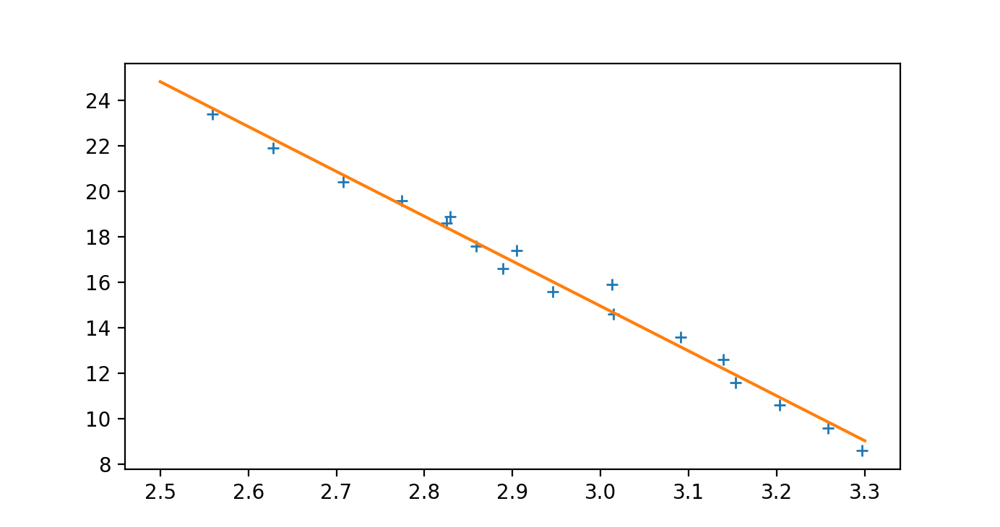

In [134]:
plt.figure()
plt.plot(vsfull, bsfull, '+')
x1 = np.array([2.5, 3.3])
plt.plot(x1, x1*slfull + bfull)

In [39]:
slfull

-19.73450247935806

In [296]:
nfull2 = C*(Vfull - V0cnp2)/1.602e-19
a = 0.246e-9
theta2 = np.sqrt(np.sqrt(3)*nfull2*a**2/8)*180/np.pi
print('angle on contacts 16-21: {:.4f} degrees'.format(theta2))

angle on contacts 16-21: 0.7888 degrees


<IPython.core.display.Javascript object>


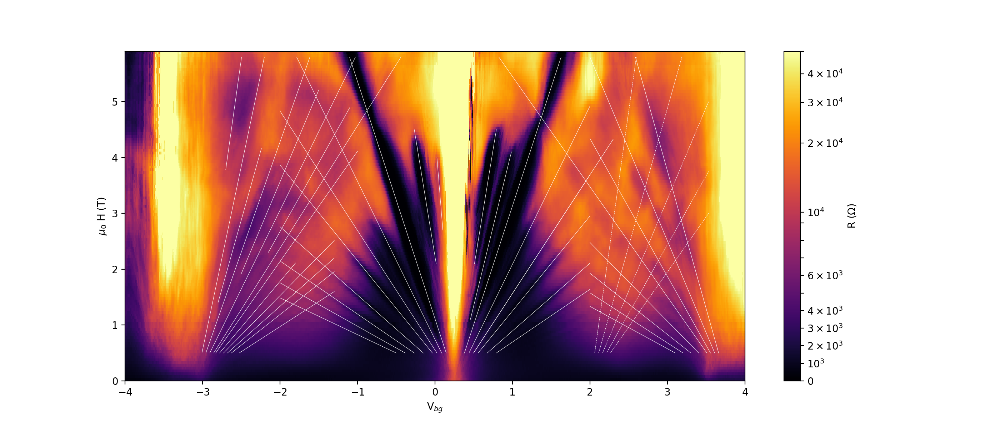

Text(0, 0.5, '$\\mu_0$ H (T)')

In [297]:
plt.figure(figsize=(14, 6))
plt.pcolormesh(fangate, fanfield, Rxx1621, norm=SymLogNorm(9000, vmin=0, vmax=0.5e5), cmap='inferno')
plt.colorbar(label='R ($\Omega$)')
# norm=SymLogNorm(3000, vmin=0, vmax=1e5)


B = 5.8
Bs = 0.5
LW = 0.4

for i in [-6, -4, 4]:
    x = np.array([(B*i - bcnp)/slcnp, (Bs*i - bcnp)/slcnp])
    plt.plot(x, (x*slcnp + bcnp)/i, color='white', lw=LW)
    
for i in [-2, 2]:
    x = np.array([(4.5*i - bcnp)/slcnp, (2.1*i - bcnp)/slcnp])
    plt.plot(x, (x*slcnp + bcnp)/i, color='white', lw=LW)
    
i = 3
x = np.array([(4.1*i - bcnp)/slcnp, (1.1*i - bcnp)/slcnp])
plt.plot(x, (x*slcnp + bcnp)/i, color='white', lw=LW)

i = -1
x = np.array([(4*i - b)/sl, (2.7*i - b)/sl])
plt.plot(x, (x*sl + b)/i, color='white', lw=LW)

for i in [6, 8, 10, 14, 18]:
    x = np.array([2, (Bs*i - bcnp)/slcnp])
    plt.plot(x, (x*slcnp + bcnp)/i, color='white', lw=LW)
    
i = 8
x = np.array([2.3, (Bs*i - bcnp)/slcnp])
plt.plot(x, (x*slcnp + bcnp)/i, color='white', lw=LW)
    
for i in [-8, -10]:
    x = np.array([-2, (Bs*i - b)/sl])
    plt.plot(x, (x*sl + b)/i, color='white', lw=LW)
    
for i in [-14, -18, -22, -26]:
    x = np.array([-2, (Bs*i - b)/sl])
    plt.plot(x, (x*sl + b)/i, color='white', lw=LW)

bfullp = bfull + 0.07

for i in [-4, -6, -10]:
#     x = np.array([2, 4])
    x = np.array([(B*-i - bfullp)/slfull, (Bs*-i - bfullp)/slfull])
    plt.plot(x, (x*slfull + bfullp)/-i, color='white', lw=LW)
    
for i in [-8, -14, -18, -22, -26]:
    x = np.array([2, (Bs*-i - bfull)/slfull])
    plt.plot(x, (x*slfull + bfull)/-i, color='white', lw=LW)
    
Vfulln = V0cnp2 - (Vfull - V0cnp2) +0.15
bfulln = bfull*Vfulln/Vfull

for i in [3, 5, 7, 9]:
    x = np.array([(B*-i - bfulln)/slfull, (Bs*-i - bfulln)/slfull])
    plt.plot(x, (x*slfull + bfulln)/-i, color='white', lw=LW)
    
i = 2
x = np.array([-2.7, (B*-i - bfulln)/slfull])
plt.plot(x, (x*slfull + bfulln)/-i, color='white', lw=LW)

i = 4
x = np.array([-2.8, -2.24])
plt.plot(x, (x*slfull + bfulln)/-i, color='white', lw=LW)

i = 6
x = np.array([-2.5, -1.5])
plt.plot(x, (x*slfull + bfulln)/-i, color='white', lw=LW)

i = 8
x = np.array([-2.15, -1.1])
plt.plot(x, (x*slfull + bfulln)/-i, color='white', lw=LW)

i = 10
x = np.array([-1, (Bs*-i - bfulln)/slfull])
plt.plot(x, (x*slfull + bfulln)/-i, color='white', lw=LW)

i = 12
x = np.array([-1.8, (Bs*-i - bfulln)/slfull])
plt.plot(x, (x*slfull + bfulln)/-i, color='white', lw=LW)
    
for i in [14, 16, 18, 22]:
    x = np.array([-1.3, (Bs*-i - bfulln)/slfull])
    plt.plot(x, (x*slfull + bfulln)/-i, color='white', lw=LW)

# for i in [13, 15, 17, 19]:
#     x = np.array([-1.3, Vfulln])
#     plt.plot(x, (x*slfull + bfulln)/-i, color='white', lw=LW)
    

Vhalf2p = V0cnp2 + (Vfull - V0cnp2)/2
bhalf2p = -Vhalf2p*-slfull

for i in [2, 4]:
    x = np.array([(B*i - bhalf2p)/-slfull, (Bs*i - bhalf2p)/-slfull])
    plt.plot(x, (x*-slfull + bhalf2p)/i, '--', color='white', lw=LW)
    
for i in [6, 8, 10]:
    x = np.array([3.53, (Bs*i - bhalf2p)/-slfull])
    plt.plot(x, (x*-slfull + bhalf2p)/i, '--', color='white', lw=LW)


# plt.axis(a)
# x1 = np.array([V0cnp2, 1.5])
# plt.plot(x1, (x1*slcnp + bcnp)/4, color='white')
# plt.plot(x1, (x1*slcnp + bcnp)/6, color='white')
# plt.plot(x1, (x1*slcnp + bcnp)/8, color='white')
# plt.plot(x1, (x1*slcnp + bcnp)/10, color='white')
# plt.xlabel('n (10$^{12}$ cm$^{-2}$)')

plt.xlabel('V$_{bg}$')
plt.ylabel('$\mu_0$ H (T)')

# plt.savefig(figfile+'M20_1621_Fanwithlines', dpi=400)

In [304]:
vf1 = -bfullp/slfull
vf1 - V0cnp2

3.4991463591517817

In [305]:
vf2 = -bfulln/slfull
V0cnp2 - vf2

3.3455992720096956

In [303]:
(vf1 - vf2)/2

3.4223728155807387

In [42]:
Vfpfan2 = -bfullp/slfull
Vfnfan2 = -bfulln/slfull
print(Vfpfan2, Vfnfan2)

3.761276228803166 -3.0834694023583116


In [44]:
print((Vfpfan2 + Vfnfan2)/2, V0)  # also a little off-center, it seems

0.3389034132224271 0.25876000000000016


In [50]:
nffan2 = (Vfpfan2-Vfnfan2)/2*C/1.602e-19
print(nffan2/10**16)  # in 10**12 cm^-2
thetafan2 = np.sqrt(np.sqrt(3)*nffan2*a**2/8)*180/np.pi
print('angle on contacts 16-21: {:.4f} degrees'.format(thetafan2))

1.4161418136484043
angle on contacts 16-21: 0.7805 degrees


### Temperature data

In [133]:
lowTdata = qc.load_data('data/2019-12-02/#008_M20_14-15_865_21-16_830_T-gatesweep_0p5to1K_0.4nA_22-56-13')
midTdata_1 = qc.load_data('data/2019-12-03/#001_M20_14-15_865_21-16_830_T-gatesweep_1p05to1p4K_0.4nA_03-42-41')
midTdata_2 = qc.load_data('data/2019-12-03/#002_M20_14-15_865_21-16_830_T-gatesweep_1p45to2K_0.4nA_05-37-20')
highTdata = qc.load_data('data/2019-12-03/#003_M20_14-15_865_21-16_830_T-gatesweep_2.1to10K_0.4nA_09-06-36')

In [134]:
Ts = np.concatenate((lowTdata.triton_pid_setpoint_set[:], midTdata_1.triton_pid_setpoint_set[:], midTdata_2.triton_pid_setpoint_set[:], highTdata.triton_pid_setpoint_set[:]))
gs = lowTdata.srframe_volt_p1_set[0, :]

In [135]:
RxxT1415 = np.vstack((Rxxfromdata(lowTdata, 0.4e-9, 'lockin865'), Rxxfromdata(midTdata_1, 0.4e-9, 'lockin865'), Rxxfromdata(midTdata_2, 0.4e-9, 'lockin865'), Rxxfromdata(highTdata, 0.4e-9, 'lockin865')))
RxxT1621 = np.vstack((Rxxfromdata(lowTdata, 0.4e-9, 'lockin830'), Rxxfromdata(midTdata_1, 0.4e-9, 'lockin830'), Rxxfromdata(midTdata_2, 0.4e-9, 'lockin830'), Rxxfromdata(highTdata, 0.4e-9, 'lockin830')))

<IPython.core.display.Javascript object>


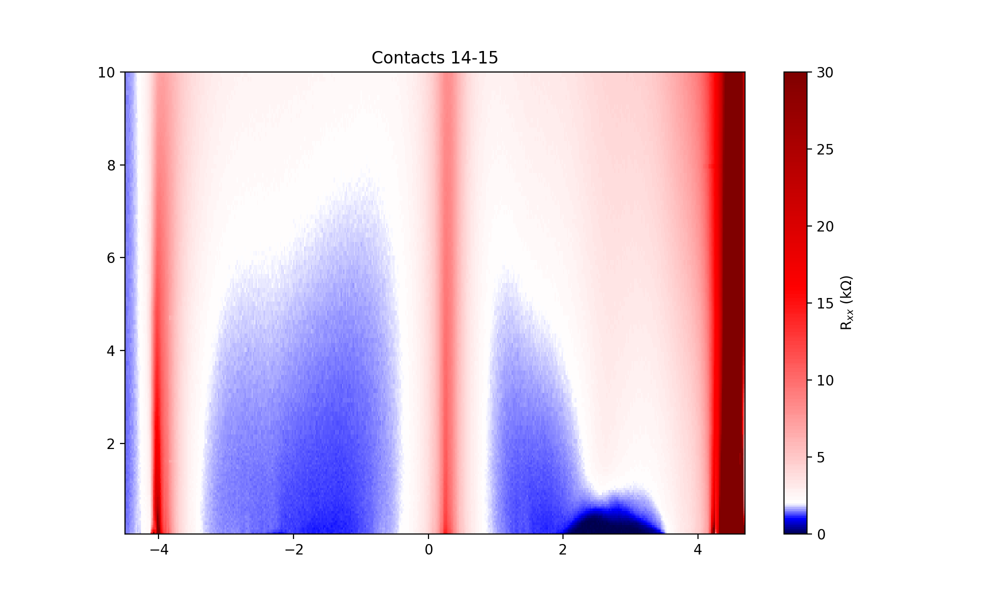

Text(0.5, 1.0, 'Contacts 14-15')

In [175]:
coff = colors.DivergingNorm(vcenter=2, vmin=0, vmax=30)

plt.figure(figsize=(10, 6))
plt.pcolormesh(gs, Ts, RxxT1415/1000, norm=coff, cmap='seismic')
plt.colorbar(label='R$_{xx}$ (k$\Omega$)')
plt.title('Contacts 14-15')

In [108]:
gs[24]

-4.02

In [100]:
npd.val_to_index([-4.0], gs)

[25]

<IPython.core.display.Javascript object>


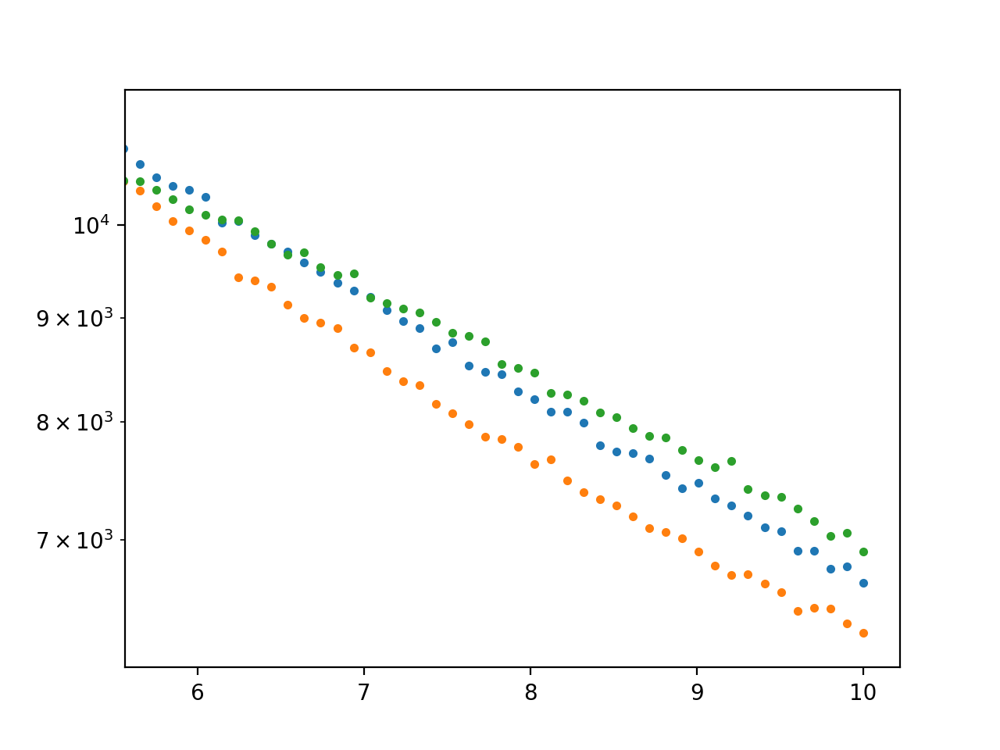

In [186]:
plt.figure()
plt.semilogy(Ts, RxxT1415[:, 24], '.')
plt.semilogy(Ts, RxxT1415[:, 23], '.')
plt.semilogy(Ts, RxxT1415[:, 25], '.')

<IPython.core.display.Javascript object>


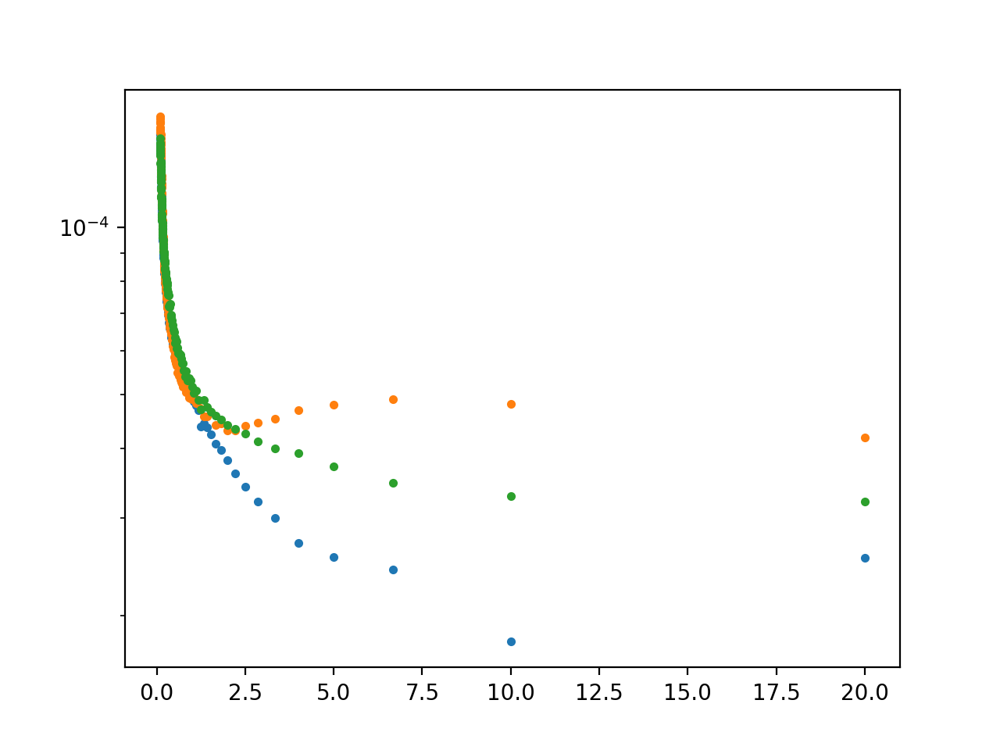

In [185]:
plt.figure()
plt.semilogy(1/Ts, 1/RxxT1415[:, 24], '.')
plt.semilogy(1/Ts, 1/RxxT1415[:, 23], '.')
plt.semilogy(1/Ts, 1/RxxT1415[:, 25], '.')

<IPython.core.display.Javascript object>


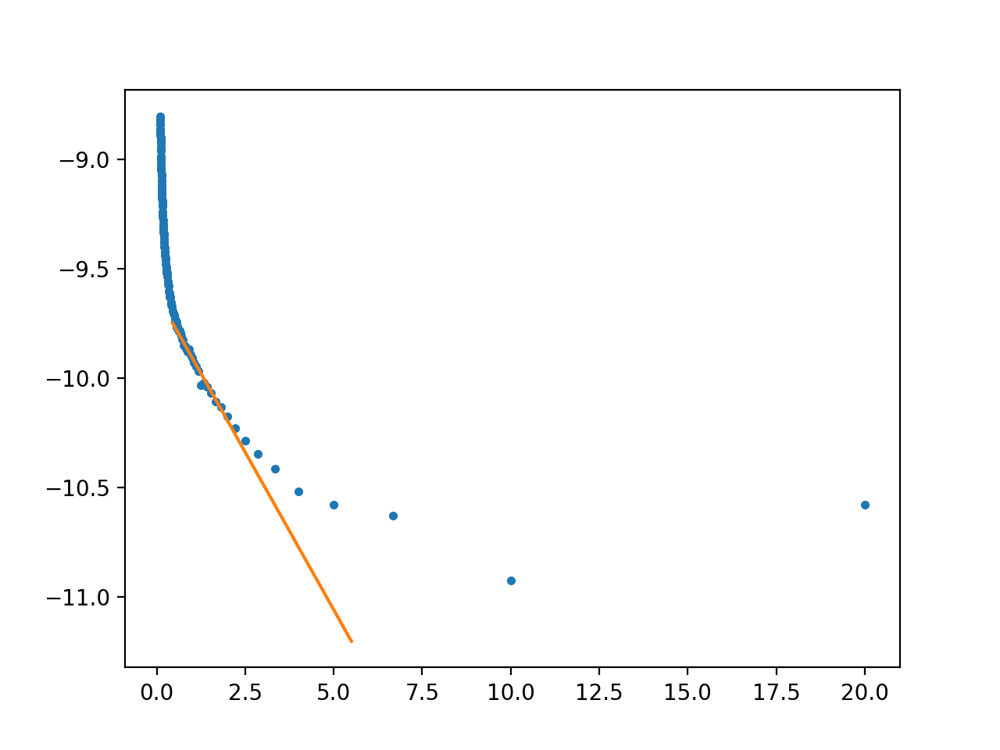

In [177]:
n1 = 8  #nope
n2 = 33
gfnsl, gfnb = np.polyfit(1/Ts[n1:n2], np.log(1/RxxT1415[n1:n2, 24]), 1)
gfnsl2, gfnb2 = np.polyfit(1/Ts[110:121], np.log(1/RxxT1415[110:121, 24]), 1)
plt.figure()
plt.plot(1/Ts, np.log(1/RxxT1415[:, 24]), '.')
x = np.linspace(0.45, 5.5, 100)
plt.plot(x, gfnsl*x + gfnb)


<IPython.core.display.Javascript object>


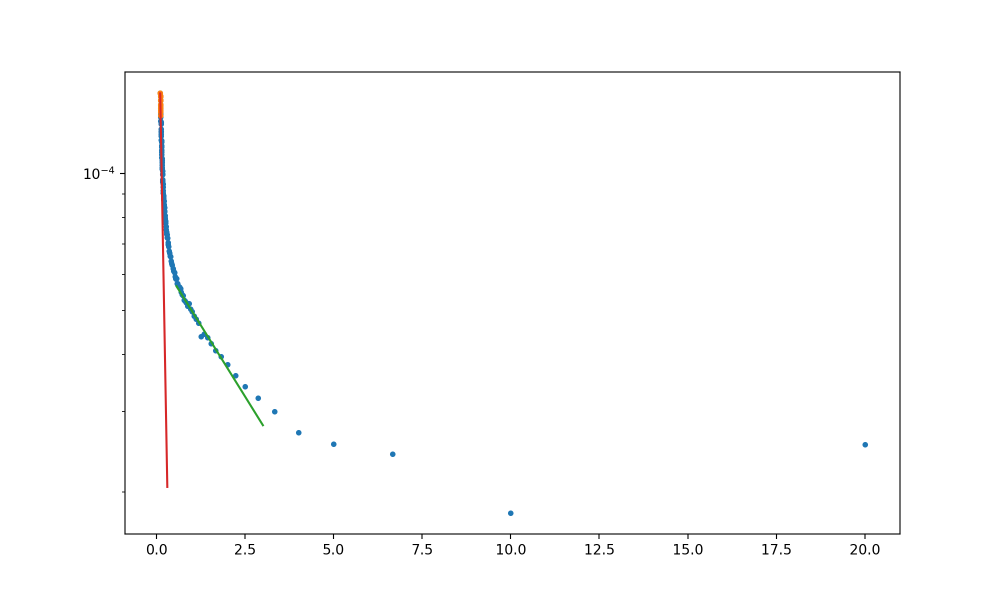

In [180]:
plt.figure(figsize=(10, 6))  #nope to the green one
n1 = 110
n2 = 121
plt.semilogy(1/Ts, 1/RxxT1415[:, 24], '.')
plt.semilogy(1/Ts[n1:n2], 1/RxxT1415[n1:n2, 24], '.')
xtexp = np.linspace(0.56, 3, 100)
plt.semilogy(xtexp, np.exp(gfnsl*xtexp + gfnb))
xtexp2 = np.linspace(0.1, 0.3, 100)
plt.semilogy(xtexp2, np.exp(gfnsl2*xtexp2 + gfnb2))
# plt.axis(a)

In [157]:
a = plt.axis()

In [158]:
-gfnsl*1.381e-23/1.602e-19*1000*2

0.04962490812817248

In [179]:
-gfnsl2*1.381e-23/1.602e-19*1000*2

1.7134594236915026

In [98]:
V0

0.25876000000000016

In [97]:
Vfn

-4.1796052948959215

<IPython.core.display.Javascript object>


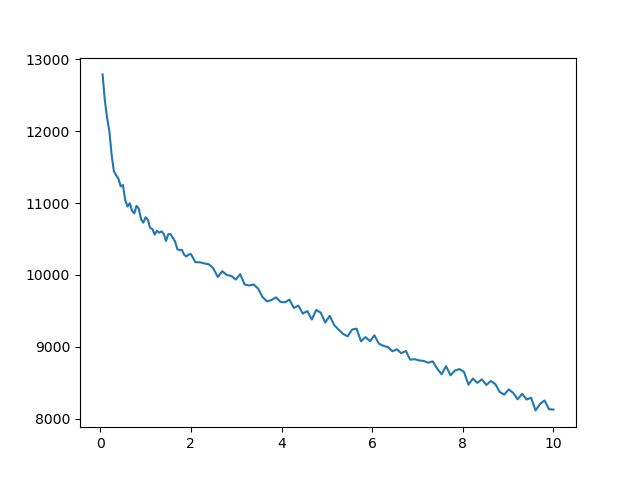

In [204]:
plt.figure()
plt.plot(Ts, RxxT1415[:, 239])

<IPython.core.display.Javascript object>


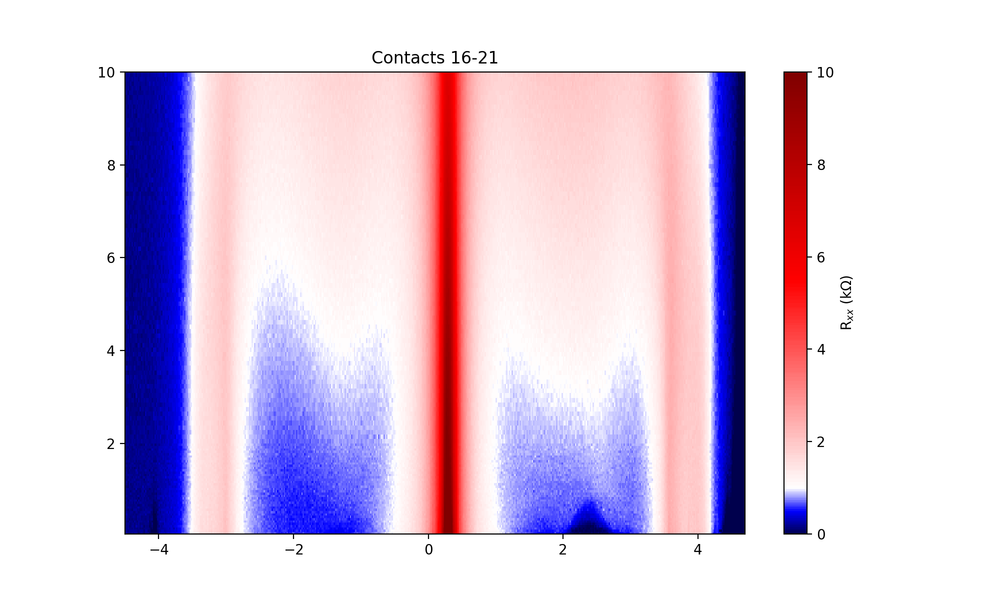

Text(0.5, 1.0, 'Contacts 16-21')

In [160]:
coff = colors.DivergingNorm(vcenter=1, vmin=0, vmax=10)

nav = 3
plt.figure(figsize=(10, 6))
plt.pcolormesh(gs, Ts, RxxT1621/1000, norm=coff, cmap='seismic')
plt.colorbar(label='R$_{xx}$ (k$\Omega$)')
plt.title('Contacts 16-21')

In [187]:
npd.val_to_index([V0], gs)

0.26 is not a value in the array
Plotted 0.26 instead


[238]

In [202]:
gs[239]

0.279999999999999

<IPython.core.display.Javascript object>


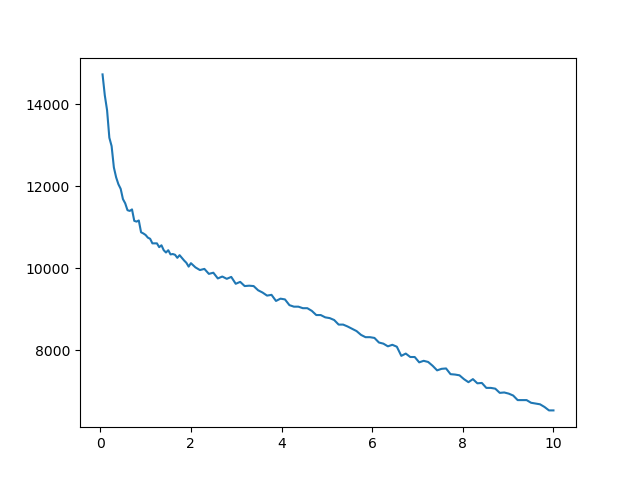

In [203]:
plt.figure()
plt.plot(Ts[:], RxxT1621[:, 239])

In [161]:
npd.val_to_index([-3.0], gs)

[75]

<IPython.core.display.Javascript object>


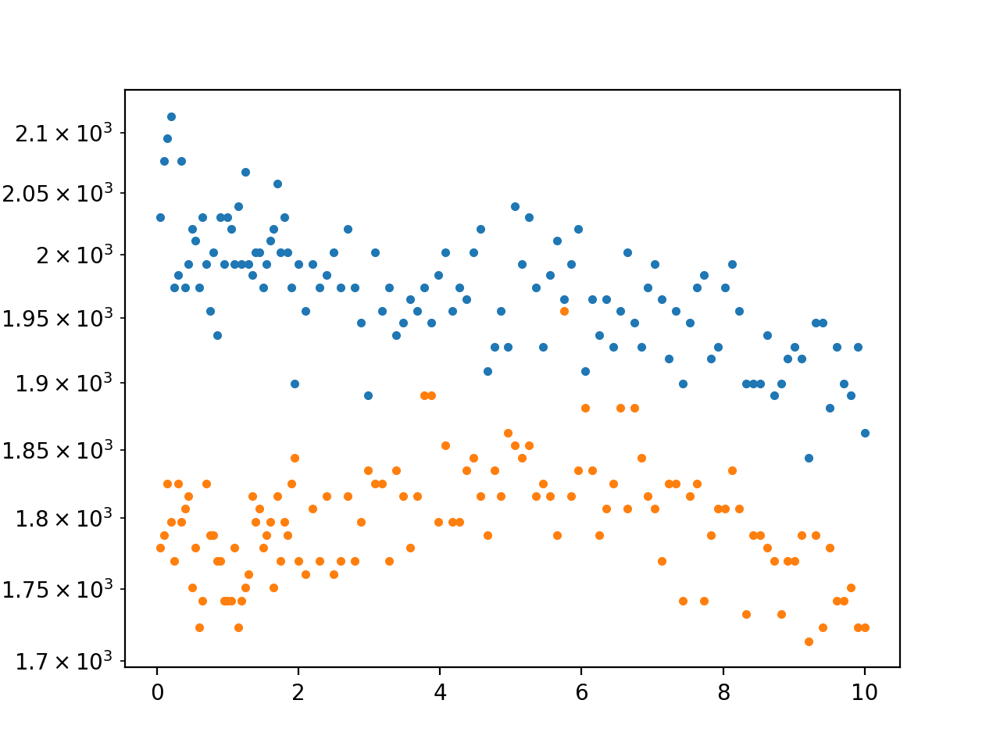

In [201]:
plt.figure()
plt.semilogy(Ts, RxxT1621[:, 75], '.')
plt.semilogy(Ts, RxxT1621[:, 68], '.')

### dv/di curves on 16-15

In [677]:
# 2.3 Vbg
dfraun = qc.load_data('data/2019-12-10/#001_M20_16-15_865_16-45_830_Bsweep_vbg=2.3V_AC0.5nAdvdi_baseT_01-56-24')
dvdi1615 = dfraun.lockin865_X[:, :]/0.5e-9
bfraun1615 = dfraun.triton_field_set_stable_set[:]
ifraun1615 = dfraun.srframe_volt_p5_set[0, :]/100e6
vfraun1615 = npd.iv_from_dvdi(dvdi1615, ifraun1615)

<IPython.core.display.Javascript object>


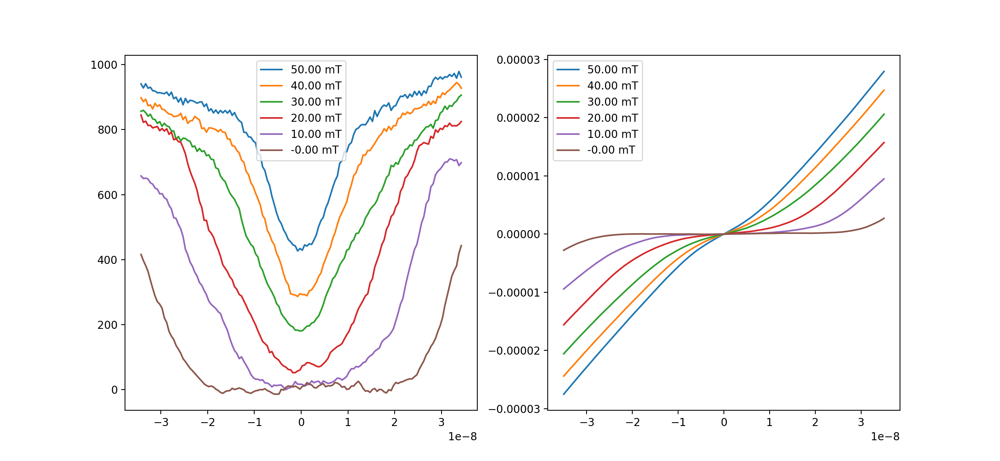

In [699]:
fig, ax = plt.subplots(1, 2, figsize=(13, 6))
nav = 4
for i in range(6):
    ind = 15*i
    ax[0].plot(npd.mov_average(ifraun1615, nav), npd.mov_average(dvdi1615[ind, :], nav), label='{:.2f} mT'.format(bfraun1615[ind]*1000))
    ax[1].plot(ifraun1615, vfraun1615[ind, :], label='{:.2f} mT'.format(bfraun1615[ind]*1000))
    
ax[0].legend()
ax[1].legend()

In [689]:
# contacts 21-16
dfraun2 = qc.load_data('data/2019-12-04/#004_M20_21-16_865_16-15_830_Bsweep_vbg=2.3V_AC0.5nAdvdi_baseT_17-25-59')
dvdi2116 = dfraun2.lockin865_X[:, :]/0.5e-9
bfraun2116 = dfraun2.triton_field_set_stable_set[:]
ifraun2116 = dfraun2.srframe_volt_p5_set[0, :]/100e6
vfraun2116 = npd.iv_from_dvdi(dvdi2116, ifraun2116)

<IPython.core.display.Javascript object>


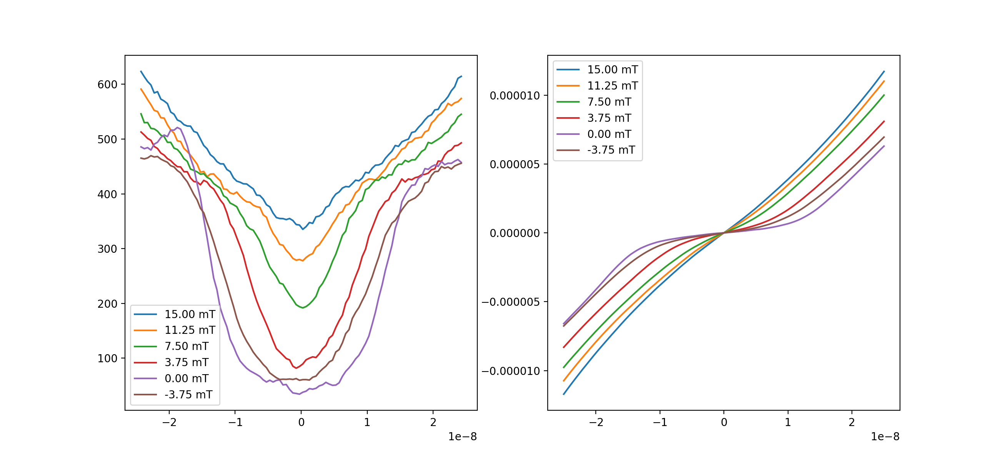

In [701]:
fig, ax = plt.subplots(1, 2, figsize=(13, 6))
nav = 4
for i in range(6):
    ind = 15*i
    ax[0].plot(npd.mov_average(ifraun2116, nav), npd.mov_average(dvdi2116[ind, :], nav), label='{:.2f} mT'.format(bfraun2116[ind]*1000))
    ax[1].plot(ifraun2116, vfraun2116[ind, :], label='{:.2f} mT'.format(bfraun2116[ind]*1000))
    
ax[0].legend()
ax[1].legend()

In [695]:
# Contacts 14-15
dfraun3 = qc.load_data('data/2019-12-02/#004_M20_14-15_865_21-16_830_Bsweep_vbg=2.3V_AC0.5nAdvdi_baseT_16-48-56')
dvdi1415 = dfraun3.lockin865_X[:, :]/0.5e-9
bfraun1415 = dfraun3.triton_field_set_stable_set[:]
ifraun1415 = dfraun3.srframe_volt_p5_set[0, :]/100e6
vfraun1415 = npd.iv_from_dvdi(dvdi1415, ifraun1415)

<IPython.core.display.Javascript object>


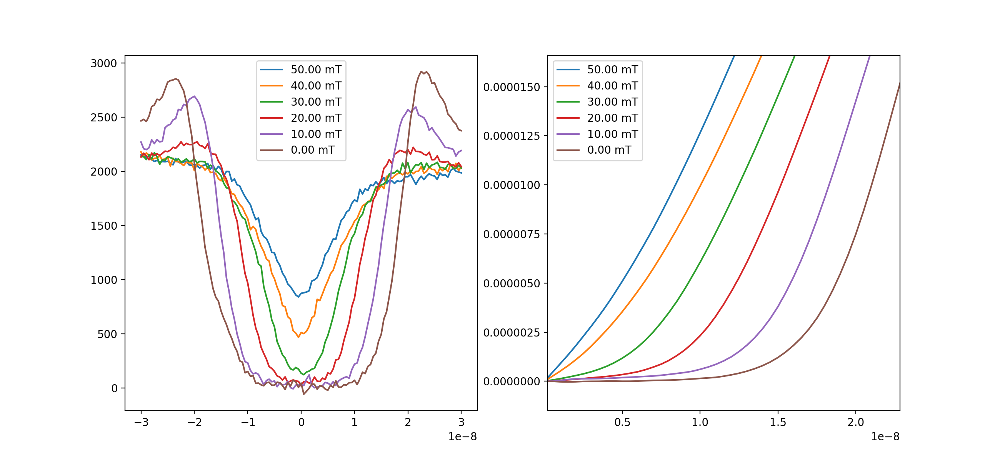

In [697]:
fig, ax = plt.subplots(1, 2, figsize=(13, 6))
for i in range(6):
    ind = 10*i
    ax[0].plot(ifraun1415, dvdi1415[ind, :], label='{:.2f} mT'.format(bfraun1415[ind]*1000))
    ax[1].plot(ifraun1415, vfraun1415[ind, :], label='{:.2f} mT'.format(bfraun1415[ind]*1000))
    
ax[0].legend()
ax[1].legend()

## Fraunhofer patterns

In [730]:
# smoothen in the current direction
nav = 4
ifraun1615_smooth = npd.mov_average(ifraun1615, nav)
dvdi1615_smooth = np.zeros((dvdi1615.shape[0], dvdi1615.shape[1] - (nav - 1)))
for i in range(len(bfraun1615)):
    dvdi1615_smooth[i, :] = npd.mov_average(dvdi1615[i, :], nav)

<IPython.core.display.Javascript object>


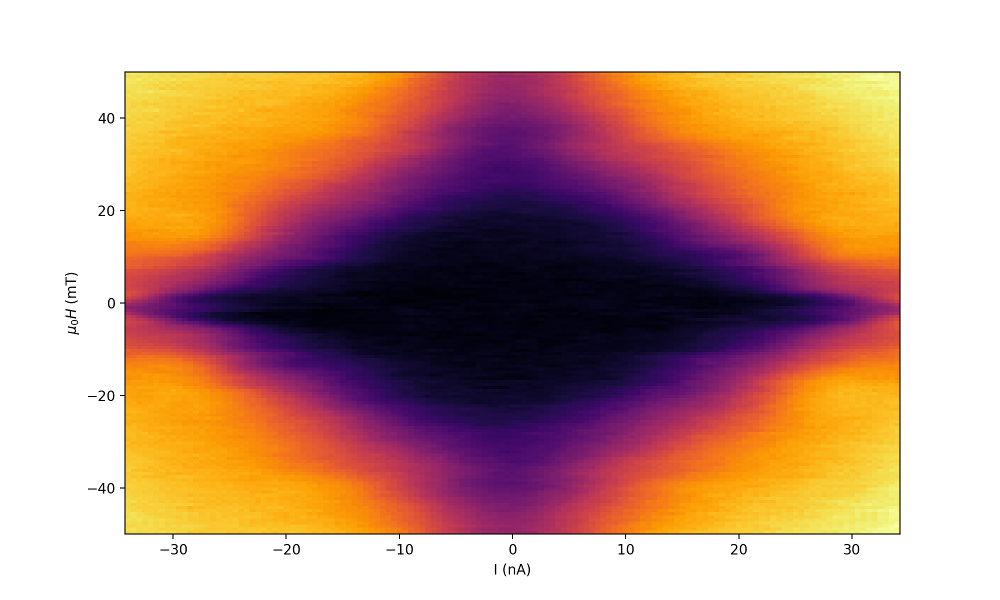

Text(0, 0.5, '$\\mu_0 H$ (mT)')

In [732]:
plt.figure(figsize=(10, 6))
plt.pcolormesh(ifraun1615_smooth/1e-9, bfraun1615*1000, dvdi1615_smooth, cmap='inferno')
plt.xlabel('I (nA)')
plt.ylabel('$\mu_0 H$ (mT)')

In [824]:
fd = interp2d(ifraun1615_smooth, bfraun1615, dvdi1615_smooth, kind='cubic')

In [825]:
curr = np.linspace(-3.5e-8, 3.5e-8, 800)
b = np.linspace(-0.05, 0.05, 800)
dvdi1615_interp = fd(curr, b)

<IPython.core.display.Javascript object>


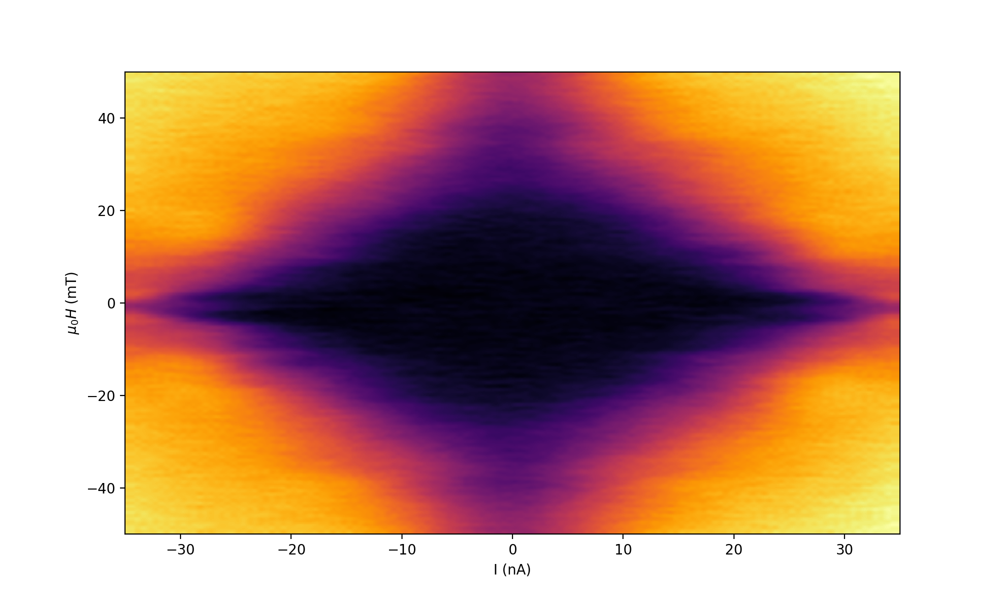

Text(0, 0.5, '$\\mu_0 H$ (mT)')

In [826]:
plt.figure(figsize=(10, 6))
plt.pcolormesh(curr/1e-9, b*1000, dvdi1615_interp, cmap='inferno')
plt.xlabel('I (nA)')
plt.ylabel('$\mu_0 H$ (mT)')

In [828]:
npd.val_to_index([0.01], b)

0.01 is not a value in the array
Plotted 0.01 instead


[479]

In [829]:
npd.val_to_index([0.01], bfraun1615)

[60]

<IPython.core.display.Javascript object>


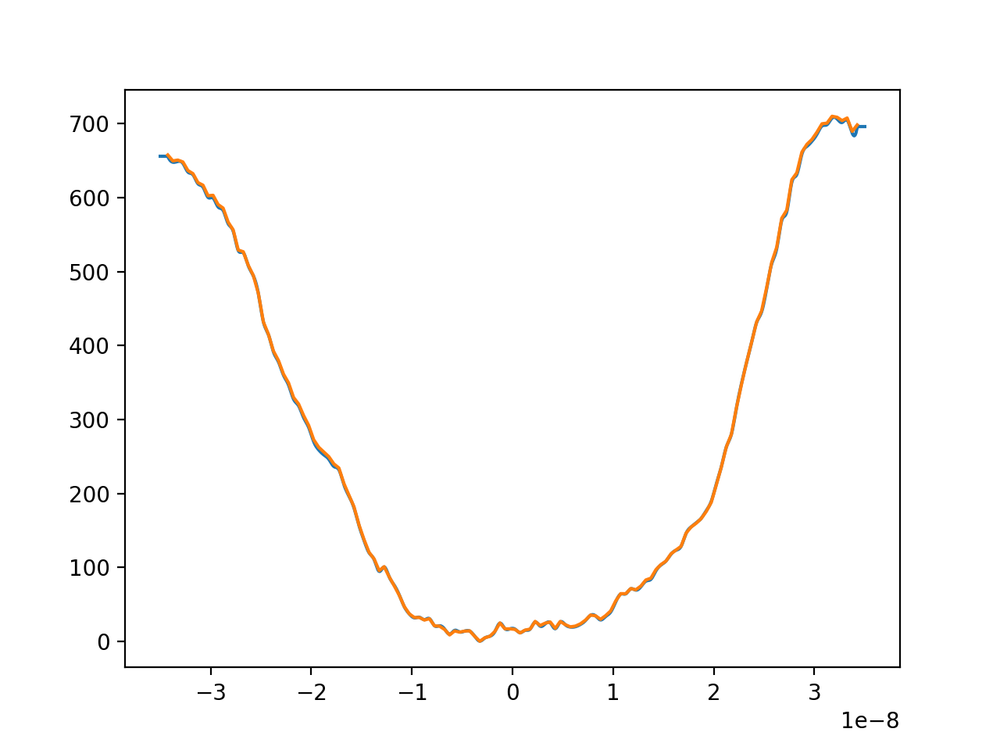

In [835]:
plt.figure()
plt.plot(curr, dvdi1615_interp[479, :])
plt.plot(ifraun1615_smooth, dvdi1615_smooth[60, :])

In [831]:
from scipy.interpolate import RectBivariateSpline

In [842]:
currs, bs = np.meshgrid(curr*10**9, bfraun1615*1000)
currs = currs.ravel()
bs = bs.ravel()
dvdi1615_smoothr = dvdi1615.ravel()

In [847]:
ifraun1615[::-1]

array([-3.50e-08, -3.45e-08, -3.40e-08, -3.35e-08, -3.30e-08, -3.25e-08,
       -3.20e-08, -3.15e-08, -3.10e-08, -3.05e-08, -3.00e-08, -2.95e-08,
       -2.90e-08, -2.85e-08, -2.80e-08, -2.75e-08, -2.70e-08, -2.65e-08,
       -2.60e-08, -2.55e-08, -2.50e-08, -2.45e-08, -2.40e-08, -2.35e-08,
       -2.30e-08, -2.25e-08, -2.20e-08, -2.15e-08, -2.10e-08, -2.05e-08,
       -2.00e-08, -1.95e-08, -1.90e-08, -1.85e-08, -1.80e-08, -1.75e-08,
       -1.70e-08, -1.65e-08, -1.60e-08, -1.55e-08, -1.50e-08, -1.45e-08,
       -1.40e-08, -1.35e-08, -1.30e-08, -1.25e-08, -1.20e-08, -1.15e-08,
       -1.10e-08, -1.05e-08, -1.00e-08, -9.50e-09, -9.00e-09, -8.50e-09,
       -8.00e-09, -7.50e-09, -7.00e-09, -6.50e-09, -6.00e-09, -5.50e-09,
       -5.00e-09, -4.50e-09, -4.00e-09, -3.50e-09, -3.00e-09, -2.50e-09,
       -2.00e-09, -1.50e-09, -1.00e-09, -5.00e-10,  0.00e+00,  5.00e-10,
        1.00e-09,  1.50e-09,  2.00e-09,  2.50e-09,  3.00e-09,  3.50e-09,
        4.00e-09,  4.50e-09,  5.00e-09,  5.50e-09, 

In [856]:
ifraun1615_smooth.shape

(138,)

In [855]:
dvdi1615_smooth.shape

(151, 138)

In [873]:
151*138

20838

In [919]:
f = RectBivariateSpline(ifraun1615_smooth[::-1], bfraun1615[::-1], dvdi1615_smooth.T, s=1.2e6)  # need to figure out the details here for getting the ascending order correct.

<IPython.core.display.Javascript object>


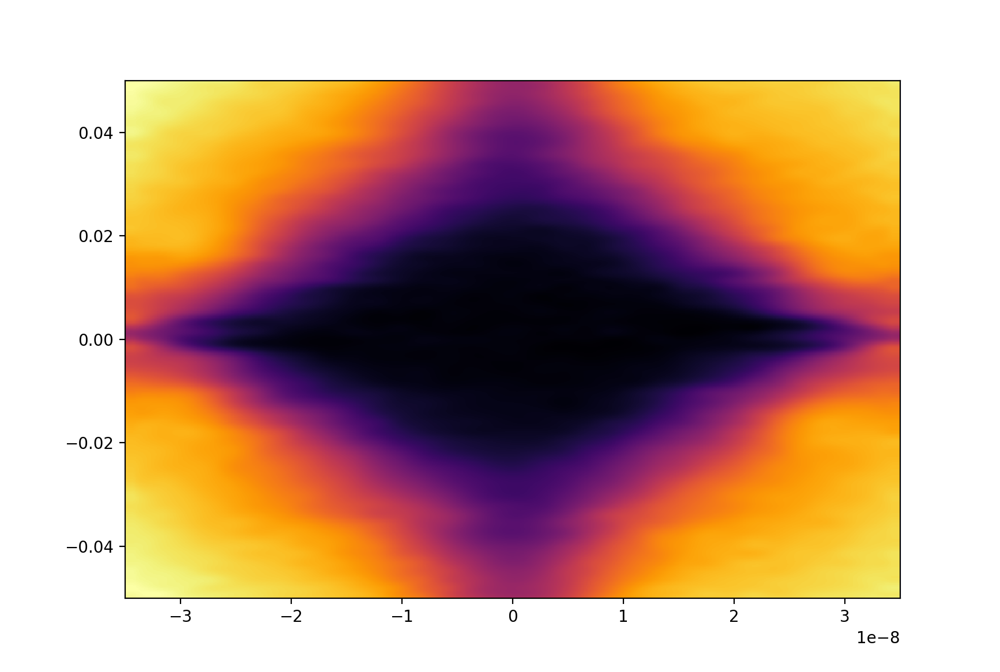

In [921]:
curr = np.linspace(-3.5e-8, 3.5e-8, 800)
b = np.linspace(-0.05, 0.05, 800)
dvdi_verysmooth = f(curr, b).T
plt.figure()
plt.pcolormesh(curr, b, dvdi_verysmooth, cmap='inferno')

In [924]:
npd.val_to_index([-0.01], b)

-0.01 is not a value in the array
Plotted -0.01 instead


[320]

In [930]:
npd.val_to_index([0], bfraun1615)

0.00 is not a value in the array
Plotted -0.00 instead


[75]

<IPython.core.display.Javascript object>


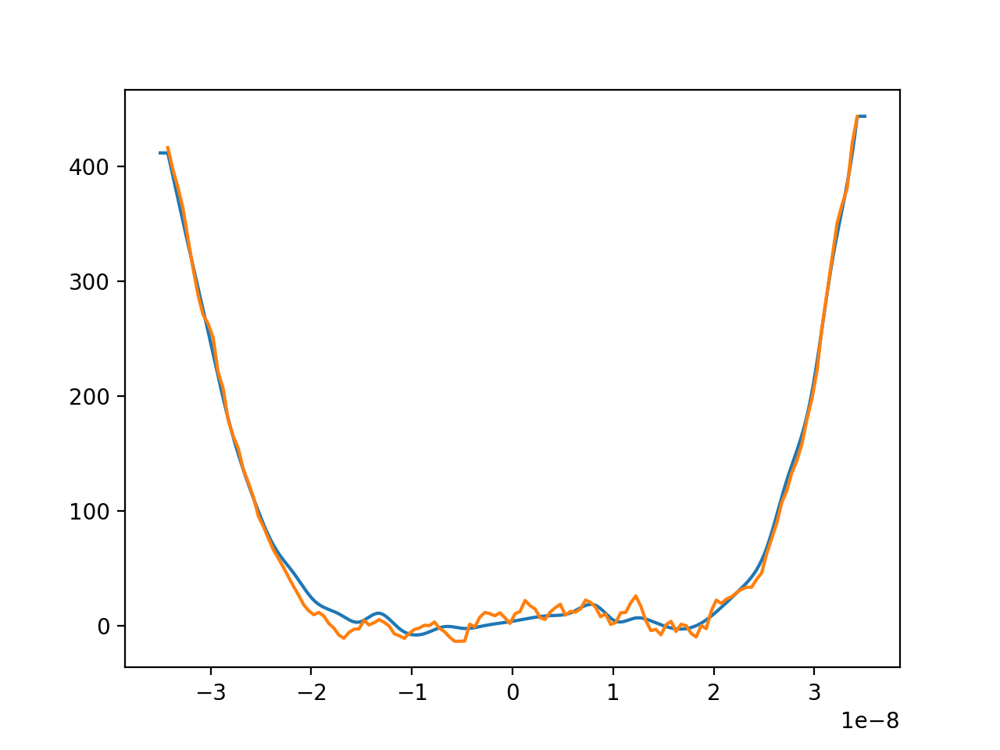

In [931]:
plt.figure()
plt.plot(curr, dvdi_verysmooth[400, :][::-1])
plt.plot(ifraun1615_smooth, dvdi1615_smooth[75, :])

In [1132]:
# Try it on a fan
fanf = RectBivariateSpline(fangate, fanfield[::-1], np.flip(Rxx1621, axis=0).T, s=0.988872658884731064e11)

In [1138]:
# and try the smoothing in the gate direction
nav = 5
fangate_smooth = npd.mov_average(fangate, nav)
Rxx1621_smooth = np.zeros((Rxx1621.shape[0], Rxx1621.shape[1] - (nav - 1)))
for i in range(len(fanfield)):
    Rxx1621_smooth[i, :] = npd.mov_average(Rxx1621[i, :], nav)

<IPython.core.display.Javascript object>


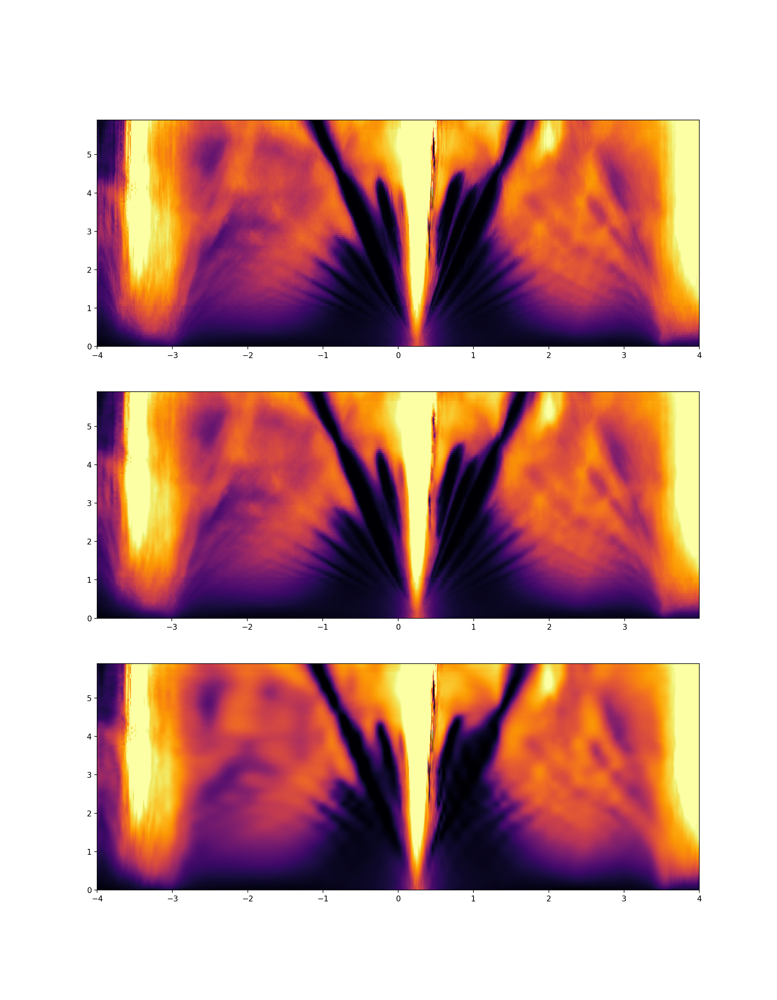

In [1139]:
fangate_i = np.linspace(-4, 4, 1201)
fanfield_i = np.linspace(0, 5.9, 961)
rxx1621_i = fanf(fangate_i, fanfield_i).T

fig, ax = plt.subplots(3, 1, figsize=(14, 18))
ax[0].pcolormesh(fangate, fanfield, Rxx1621, norm=SymLogNorm(9000, vmin=0, vmax=0.5e5), cmap='inferno')
# ax[0].colorbar(label='R ($\Omega$)')
ax[2].pcolormesh(fangate_i, fanfield_i, rxx1621_i, norm=SymLogNorm(9000, vmin=0, vmax=0.5e5), cmap='inferno')
# ax[1].colorbar(label='R ($\Omega$)')
ax[1].pcolormesh(fangate_smooth, fanfield, Rxx1621_smooth, norm=SymLogNorm(9000, vmin=0, vmax=0.5e5), cmap='inferno')

In [1072]:
print(npd.val_to_index([2.8], fanfield), npd.val_to_index([2.8], fanfield_i))

2.80 is not a value in the array
Plotted 2.80 instead
[62] [456]


<IPython.core.display.Javascript object>


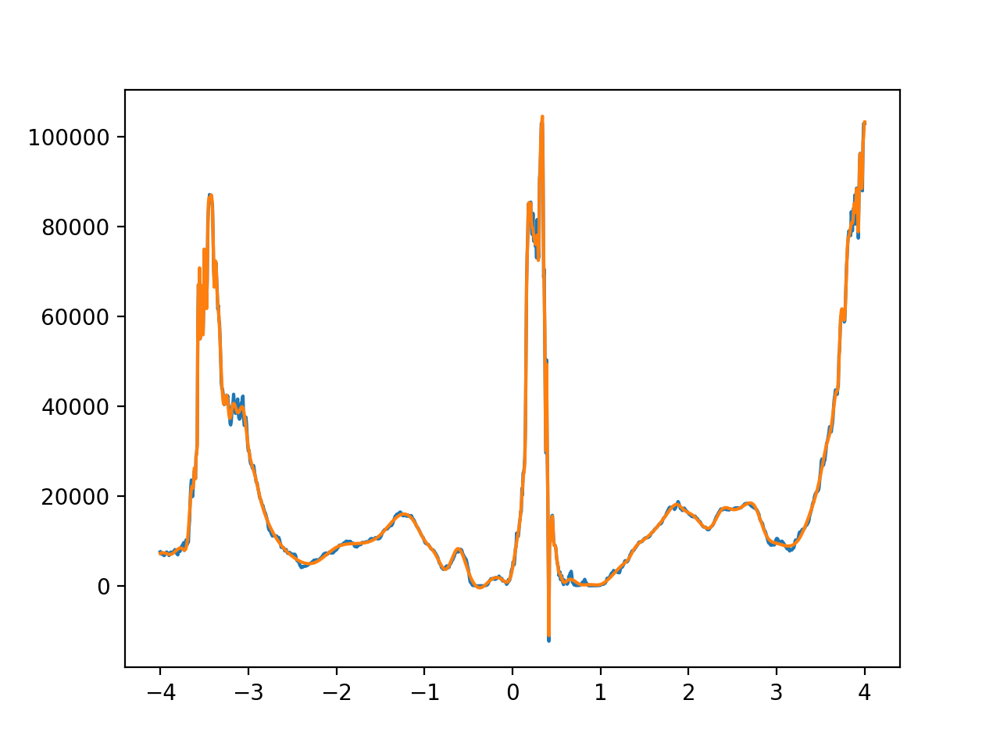

In [1134]:
plt.figure()
plt.plot(fangate, Rxx1621[62, :])
plt.plot(fangate_i, rxx1621_i[456, :])

More Temperature dependence. Here, the electrodes were mixed up a bit. The 0.87 degree data (15-14) was placed on lockin865 and the 0.83 degree data (16-15) was placed on lockin830

In [13]:
dtempbase = qc.load_data('data/2019-12-24/#003_M20_15-16_865_15-14_830_gatesweepbasetemp_0p4nA_14-26-12')
dtemp_1 = qc.load_data('data/2019-12-24/#004_M20_15-16_865_15-14_830_gateTsweepto1K_0p4nA_14-49-37')
dtemp_2 = qc.load_data('data/2019-12-24/#005_M20_15-16_865_15-14_830_gateTsweep1p1to1p4K_0p4nA_22-04-45')
dtemp_3 = qc.load_data('data/2019-12-24/#006_M20_15-16_865_15-14_830_gateTsweep1p5to2K_0p4nA_23-31-43')
dtemp_4 = qc.load_data('data/2019-12-26/#001_M20_15-16_865_15-14_830_gateTsweep2p2to10K_0p4nA_11-10-10')
dtemp_5 = qc.load_data('data/2019-12-27/#001_M20_15-16_865_15-14_830_gateTsweep11to30K_0p4nA_01-39-29')
dtemp_6 = qc.load_data('data/2019-12-27/#002_M20_15-16_865_15-14_830_gateTsweep31to40K_0p4nA_11-14-22')

In [14]:
temps = np.concatenate(([0.025], dtemp_1.triton_pid_setpoint_set, dtemp_2.triton_pid_setpoint_set[:], dtemp_3.triton_pid_setpoint_set, dtemp_4.triton_pid_setpoint_set[:], dtemp_5.triton_pid_setpoint_set, dtemp_6.triton_pid_setpoint_set[:]))
tgate = dtempbase.srframe_volt_p1_set[:]
R1514 = np.vstack((npd.Rxxfromdata(dtempbase, 0.4e-9), npd.Rxxfromdata(dtemp_1, 0.4e-9), npd.Rxxfromdata(dtemp_2, 0.4e-9), npd.Rxxfromdata(dtemp_3, 0.4e-9), npd.Rxxfromdata(dtemp_4, 0.4e-9), npd.Rxxfromdata(dtemp_5, 0.4e-9), npd.Rxxfromdata(dtemp_6, 0.4e-9)))

In [15]:
R1514corr = np.copy(R1514)
R1514corr[R1514 <= 0] = np.min(np.abs(R1514))

In [16]:
temps[71]

11.0

In [17]:
tgate_corr = tgate[:-2]  # need to correct for a gate offset at 11K
R1514corr = R1514corr[:, :-2]
R1514corr[71:, :] = R1514[71:, 2:]

In [18]:
plt.figure(figsize=(10, 6))
plt.pcolormesh(tgate_corr, temps, R1514corr, norm=DivLogNorm(0.6, vmin=50, vmax=0.5e5), cmap=cc.cm.diverging_bwr_20_95_c54)
plt.colorbar(ticks=ticker.LogLocator(subs=range(10)), format=ticker.LogFormatterMathtext())

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

Now checking for gap trends at full filling

Negative full filling

In [19]:
n1 = -30
n1_b = -27
n2 = None
vfullnind = npd.val_to_index([-4.03], tgate_corr)[0]
sl, b = np.polyfit(1/temps[n1:n2], np.log(1/R1514corr[n1:n2, vfullnind]), 1)

vfullpind = npd.val_to_index([4.56], tgate_corr)[0]
sl2, b2 = np.polyfit(1/temps[n1_b:n2], np.log(1/R1514corr[n1_b:n2, vfullpind]), 1)

-4.03 is not a value in the array
Plotted -4.04 instead


In [20]:
plt.figure()
plt.semilogy(temps, R1514corr[:, vfullnind], '.')  # this is the max resistance at lower temps

plt.semilogy(temps, R1514corr[:, vfullpind], '.') # highest at lower temperatures


Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

In [21]:

plt.figure()
plt.semilogy(1/temps, 1/R1514corr[:, vfullnind], '.')
plt.semilogy(1/temps, 1/R1514corr[:, vfullpind], '.')
n1 = -30
n1_b = -27
n2 = None
plt.semilogy(1/temps[n1:n2], 1/R1514corr[n1:n2, vfullnind], '.g')
plt.semilogy(1/temps[n1_b:n2], 1/R1514corr[n1_b:n2, vfullpind], '.g')
x1 = np.linspace(0.02, 0.2, 100)
x2 = np.linspace(0.02, 0.1, 100)
plt.semilogy(x1, np.exp(sl*x1 + b), 'r')
plt.semilogy(x2, np.exp(sl2*x2 + b2), 'r')
plt.axis((0, 0.7, 6e-6, 5e-4))
# plt.axis(a)

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

(0, 0.7, 6e-06, 0.0005)

In [22]:
a = plt.axis()

In [23]:
-sl*1.381e-23/1.602e-19*2*1000 # hole-side gap in meV (blue data points)

2.668288799793668

In [24]:
-sl2*1.381e-23/1.602e-19*2*1000 # electron-side gap in meV (yellow data points)

8.158043084418507

In [25]:
R1615 = np.vstack((npd.Rxxfromdata(dtempbase, 0.4e-9, instrument='lockin830'), npd.Rxxfromdata(dtemp_1, 0.4e-9, instrument='lockin830'), npd.Rxxfromdata(dtemp_2, 0.4e-9, instrument='lockin830'), npd.Rxxfromdata(dtemp_3, 0.4e-9, instrument='lockin830'), npd.Rxxfromdata(dtemp_4, 0.4e-9, instrument='lockin830'), npd.Rxxfromdata(dtemp_5, 0.4e-9, instrument='lockin830'), npd.Rxxfromdata(dtemp_6, 0.4e-9, instrument='lockin830')))

In [26]:
R1615corr = np.copy(R1615)
R1615corr[R1615 <= 0] = np.min(np.abs(R1615))

In [27]:
# tgate_corr = tgate[:-2]  # need to correct for a gate offset at 11K. already did this before
R1615corr = R1615corr[:, :-2]
R1615corr[71:, :] = R1615[71:, 2:]

In [28]:
plt.figure(figsize=(10, 6))
plt.pcolormesh(tgate_corr, temps, R1615corr, norm=DivLogNorm(0.66, vmin=50, vmax=0.1e5), cmap=cc.cm.diverging_bwr_20_95_c54)
plt.colorbar(ticks=ticker.LogLocator(subs=range(10)), format=ticker.LogFormatterMathtext())

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

In [29]:
# n1 = -30
# n1_b = -27
# n2 = None
vfullnind1615 = npd.val_to_index([-3.82], tgate_corr)[0]
# sl1615, b1615 = np.polyfit(1/temps[n1:n2], np.log(1/R1514corr[n1:n2, vfullnind]), 1)

vfullpind1615 = npd.val_to_index([4.24], tgate_corr)[0]
# sl2, b2 = np.polyfit(1/temps[n1_b:n2], np.log(1/R1514corr[n1_b:n2, vfullpind]), 1)

In [30]:
plt.figure()
plt.plot(temps, R1615corr[:, vfullnind1615], '.', ms=3.)
plt.plot(temps, R1615corr[:, vfullnind1615+1], '.', ms=3.)
plt.plot(temps, R1615corr[:, vfullnind1615-1], '.', ms=3.)
plt.plot(temps, R1615corr[:, vfullnind1615+2], '.', ms=3.)

RxxTav = np.average(np.vstack((R1615corr[:, vfullnind1615], R1615corr[:, vfullnind1615+1], R1615corr[:, vfullnind1615+2], R1615corr[:, vfullnind1615-1])), axis=0)
plt.plot(temps, RxxTav, '.', ms=6.0)

# plt.plot(temps, R1615corr[:, vfullpind1615], '.')

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

In [31]:
n3 = -28
n3_b = -40
n4 = None
sl1615_p, b1615_p = np.polyfit(1/temps[n3:n4], np.log(1/R1615corr[n3:n4, vfullpind1615]), 1)
sl1615_n, b1615_n = np.polyfit(1/temps[n3_b:n4], np.log(1/RxxTav[n3_b:n4]), 1)

In [32]:
plt.figure(figsize=(10, 6))
plt.semilogy(1/temps, 1/R1615corr[:, vfullpind1615], '.')
plt.semilogy(1/temps[n3:n4], 1/R1615corr[n3:n4, vfullpind1615], '.g')
xp = np.linspace(0.025, 0.12, 100)
plt.semilogy(xp, np.exp(sl1615_p*xp + b1615_p), 'r')

plt.semilogy(1/temps, 1/RxxTav, '.')
plt.semilogy(1/temps[n3_b:n4], 1/RxxTav[n3_b:n4], '.g')
xn = np.linspace(0.025, 0.2, 100)
plt.semilogy(xn, np.exp(sl1615_n*xn + b1615_n), 'r')
plt.axis([-0.0109479708636741,
 0.7,
 4.90397951400037e-05,
 0.0013299899123662676])

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

[-0.0109479708636741, 0.7, 4.90397951400037e-05, 0.0013299899123662676]

In [33]:
a

(0.0, 0.7, 6e-06, 0.0005)

In [34]:
a = plt.axis()

In [35]:
-sl1615_n*1.381e-23/1.602e-19*2*1000 # hole-side gap in meV

0.9541317871188497

In [36]:
-sl1615_p*1.381e-23/1.602e-19*2*1000 # electron-side gap in meV

3.744448436345057

0.83 degree fan

In [37]:
dp83 = qc.load_data('data/2019-12-05/#007_M20_865_21-45_830_16-45_Rxy_twodfan_0p5nA_22-32-09')
gp83 = dp83.srframe_volt_p1_set[0, :]
bp83 = dp83.triton_field_set_stable_set[40:]  # only from 5T down
Rp83 = npd.Rxxfromdata(dp83, 0.5e-9, 'lockin865')[40:, :]

In [38]:
plt.figure()
plt.pcolormesh(gp83, bp83, Rp83, cmap='inferno', norm=SymLogNorm(2000, vmin=0, vmax=1e5))
plt.ylim(0, 4)

sl0 = 16.992629165630916  #from the 0.79 degree data CNP
V0 = 0.296
Bl = 7
Bs = 0.5
b = -V0*sl0
for i in [-18, -14, -10, -6, -4, -2, 2, 3, 4, 6, 8, 10, 14]:
    x = np.array([(Bs*i - b)/sl0, (Bl*i - b)/sl0])
    plt.plot(x, (x*sl0 + b)/i, color='white', lw=0.5)

# V0f = -3.58
# bf = -V0f*sl0
# for i in [4, 6, 8, 10, 14, 18, 22]:
#     x = np.array([(Bs*i - bf)/sl0, (Bl*i - bf)/sl0])
#     plt.plot(x, (x*sl0 + bf)/i, color='white', lw=0.5)
    
V0h = 2.24
bf = -V0h*sl0
for i in [4, 6, 8, 10]:
    x = np.array([(Bs*i - bf)/sl0, (Bl*i - bf)/sl0])
    plt.plot(x, (x*sl0 + bf)/i, color='white', lw=0.5)
    
plt.axis((0.534817814493441, 3.867572122994437, 0.22386199658926953, 3.0377148104420844))

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

(0.534817814493441, 3.867572122994437, 0.22386199658926953, 3.0377148104420844)

In [39]:
Vgatefull = (V0h - V0)*2
print(Vgatefull)

3.8880000000000003


In [40]:
sl = sl0
C = sl0*1.602e-19**2/6.626e-34
dbn = 8.85e-12*3/C
print('effective capacitance: {:.4e}'.format(C))
print('effective hBN thickness: {:.1f} nm'.format(dbn*10**9))
print('V0: {}'.format(V0))

print('Full filling voltage difference: {}'.format(Vgatefull))
nfull = (Vgatefull)*C/1.602e-19/10**4
print(nfull/10**12) #10**12 cm^-2
a = 0.246e-9

theta = np.sqrt(np.sqrt(3)*nfull*10**4*a**2/8)*180/np.pi
print('theta: ', theta)

effective capacitance: 6.5816e-04
effective hBN thickness: 40.3 nm
V0: 0.296
Full filling voltage difference: 3.8880000000000003
1.5973420192868817
theta:  0.8288806816047474


# Rxy

In [9]:
drxy = qc.load_data('data/2019-12-05/#007_M20_865_21-45_830_16-45_Rxy_twodfan_0p5nA_22-32-09') # note here that at 5T down, 21-45 was switched to 15-16 (Rxx of the 0.83 degree area)

Rxy = drxy.lockin830_X[:, :]/0.5e-9
gxy = drxy.srframe_volt_p1_set[0, :]
Bxy = drxy.triton_field_set_stable_set[:]

In [10]:
esqh = 1.602e-19**2/6.626e-34

In [11]:
Vgatefull = 3.8880000000000003
V0 = 0.296
nuxy = np.interp(gxy, [V0 - 6/4*Vgatefull, V0 + 6/4*Vgatefull], [-6, 6])

In [12]:
plt.figure(figsize=(12, 6))
plt.pcolormesh(nuxy, Bxy, 1/Rxy/esqh, cmap='bwr', vmin=-10, vmax=10)
plt.colorbar(label='R$_{xy}^{-1}$ (e$^2$/h)', ticks=range(-10,11))

plt.xlabel('$\\nu$')
plt.ylabel('B (T))')
plt.xlim((-4, 4))

plt.tight_layout()
# plt.savefig(figfile + 'invRxyLandaufan_fillingfactor', bbox_inches='tight', dpi=300)

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

/Users/robertpolski/anaconda/envs/qcodes/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: divide by zero encountered in true_divide
  


In [24]:
plt.figure(figsize=(12, 6))
plt.pcolormesh(nuxy, Bxy, Rxy*esqh, vmin=-1, vmax=1, cmap='bwr')#cmap=cc.cm.diverging_bwr_20_95_c54)
plt.colorbar(label='R$_{xy}$ (h/e$^2$)', ticks=range(-10,11))

plt.xlabel('$\\nu$')
plt.ylabel('$\mu_0$ H')
plt.xlim((-4, 4))

sl = 6.5
Vgatefull = 3.8880000000000003
V0 = 0
Vfulln = -4
Vgatefull = 10.1
slfill = sl*Vgatefull/4
b = -slfill*Vfulln

Bl = 6.8
Bs = 0
LW = 0.7
dashes = (6, 5)
for i in [4, 8, 12]:
    x = np.linspace((Bs*i - b)/slfill, (Bl*i - b)/slfill, 5)
    plt.plot(x, (x*slfill + b)/i, '--', color='white', lw=LW, dashes=dashes)
    
b = -slfill*V0

Bl = 6.8
Bs = 0
LW = 0.7
dashes = (6, 5)
for i in [-12, -8, -4, 4, 8, 12]:
    x = np.linspace((Bs*i - b)/slfill, (Bl*i - b)/slfill, 5)
    plt.plot(x, (x*slfill + b)/i, '--', color='white', lw=LW, dashes=dashes)


plt.tight_layout()
# plt.savefig(figfile + 'RxyLandaufan_fillingfactor', bbox_inches='tight', dpi=300)

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …